## Feature Selection

In [1]:
# !pip3 install scipy
# %conda install scipy
# pip install matplotlib
# pip install statsmodels
# pip install seaborn
# pip install pandas-profiling==3.2.0
from datetime import datetime,timedelta, date
import pandas as pd
import numpy as np
from collections import defaultdict
import math
import warnings
warnings.filterwarnings('ignore')
import scipy.stats as stats
import boto3
from io import StringIO, BytesIO
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter
%matplotlib inline
from statsmodels.stats.weightstats import ztest as ztest
import seaborn as sns
import hvplot.pandas
import pyarrow.parquet as pq
import panel as pn
import holoviews as hv
from nltk import flatten
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9
from IPython.core.display import HTML, display
# import intake
# import bokeh
# from bokeh.resources import INLINE
import s3fs
import pickle
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import Lasso
from numpy import mean
from numpy import std
from numpy import absolute
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, OrdinalEncoder
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA, SparsePCA, IncrementalPCA
from sklearn.decomposition import TruncatedSVD
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.compose import ColumnTransformer
from sklearn import linear_model
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.metrics import *
from sklearn import preprocessing
# from multiscorer import MultiScorer
import eli5
import random
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import export_graphviz
import pydot # Pull out one tree from the forest
from scipy.stats import chi2, chi2_contingency
import Cython
import pymrmr
from pandas_profiling import ProfileReport
# import holoplot
import pytest
from sklearn.linear_model import LassoLarsCV, LassoLars
import shap
import xgboost
# import relaxed_lasso
# from relaxed_lasso import RelaxedLassoLars,RelaxedLassoLarsCV
# pip install git+https://github.com/slundberg/shap.git ?

In [35]:
# pip install multiscorer

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
ERROR: Could not find a version that satisfies the requirement multiscorer (from versions: none)
ERROR: No matching distribution found for multiscorer
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Model input data
bucket='fortunax'

path_list = []
s3 = boto3.resource("s3",
                  region_name='us-east-1',
                  aws_access_key_id='XXX',
                  aws_secret_access_key='XXX')

my_bucket = s3.Bucket(bucket)

for my_bucket_object in my_bucket.objects.filter(Prefix='survey-analysis/adsp_bl_model/100final_agg_0129/'):
    fname = my_bucket_object.key
    path_list.append(fname)

final_list = [path for path in path_list if '.parquet' in path]

final_list

['survey-analysis/adsp_bl_model/100final_agg_0129/part-00000-395230ee-862d-4d24-ad91-31516412ea83-c000.snappy.parquet']

In [3]:
obj = s3.Object(bucket, fname)
with BytesIO(obj.get()['Body'].read()) as bio:
    df = pq.read_table(bio).to_pandas()

df.head()

,SurveyId,customer_decoration_key,obfuscated_id,gender_identity,income_category,create_date_in_millis,last_updated_date_in_millis,age_group,region_id,spektr_date,...,label,test_group_selected,Type,rawPrediction,Status,Survey,Created_Date,Reward_Amount,Study_Status,Benchmark_Category
0,f056f7d5-2899-4afb-8d5a-ca42c86f2189,010113fa8facabb5fd1c0c1c7e7ed14088806830f848ff...,010113fa8facabb5fd1c0c1c7e7ed14088806830f848ff...,FEMALE,INCOME_0_50K,2022-07-02 12:00:07.707,2022-07-02 12:00:07.707,AGE_45_54,-1,1970-01-01,...,0,None,None,0.017317,ACTIVE,20221109_Kodiak_Cakes,2022-11-09,0.5,Study-ENDED,None
1,ead972d3-b50b-4626-b1b7-c48a85d2d728,01011400e14a1da2a6966b7f021abba6f9ef306120e172...,01011400e14a1da2a6966b7f021abba6f9ef306120e172...,FEMALE,INCOME_100K_150K,2021-02-17 18:43:52.956,2022-12-16 23:03:26.056,AGE_35_44,-1,1970-01-01,...,0,None,None,0.004608,ACTIVE,20221206_Ed_FX_Kindred_STV,2022-12-06,0.5,Study-ENDED,None
2,f056f7d5-2899-4afb-8d5a-ca42c86f2189,0101140c7225c4cd091150c2e916f68138df7a20161d1f...,0101140c7225c4cd091150c2e916f68138df7a20161d1f...,MALE,INCOME_100K_150K,2021-12-09 20:58:40.423,2022-12-10 21:44:37.946,AGE_55_200,-1,1970-01-01,...,0,None,None,0.017180,ACTIVE,20221109_Kodiak_Cakes,2022-11-09,0.5,Study-ENDED,None
3,f056f7d5-2899-4afb-8d5a-ca42c86f2189,0101141227435f78c8cd12b8197beff63b9049a3b0c4b9...,0101141227435f78c8cd12b8197beff63b9049a3b0c4b9...,FEMALE,INCOME_100K_150K,2022-11-22 17:42:23.910,2022-11-22 17:42:23.910,AGE_35_44,-1,1970-01-01,...,0,None,None,0.012131,ACTIVE,20221109_Kodiak_Cakes,2022-11-09,0.5,Study-ENDED,None
4,2354f96c-4706-4a94-b455-3fb32a2d4c82,0101141c09ac4ac454a77945bb2de44b42e6c5d682e301...,0101141c09ac4ac454a77945bb2de44b42e6c5d682e301...,FEMALE,INCOME_75K_100K,2021-10-22 00:31:21.804,2022-07-02 01:44:21.262,AGE_55_200,-1,1970-01-01,...,1,None,None,0.458577,ACTIVE,20221205_H1_Venmo,2022-12-05,0.5,Study-ENDED,None


In [4]:
# Response data
bucket='fortunax'

path_list = []
s3 = boto3.resource("s3",
                  region_name='us-east-1',
                  aws_access_key_id='XXX',
                  aws_secret_access_key='XXX')

my_bucket = s3.Bucket(bucket)

for my_bucket_object in my_bucket.objects.filter(Prefix='survey-analysis/adsp_bl_model/feature_selection_bl/'):
    fname = my_bucket_object.key
    path_list.append(fname)

final_list = [path for path in path_list if '.parquet' in path]

obj = s3.Object(bucket, fname)
with BytesIO(obj.get()['Body'].read()) as bio:
    df_new = pq.read_table(bio).to_pandas()
    
    
df_new.head()

,SurveyId,customer_decoration_key,obfuscated_id,gender_identity,income_category,create_date_in_millis,last_updated_date_in_millis,age_group,region_id,spektr_date,...,rawPrediction,Status,Survey,Created_Date,Reward_Amount,Study_Status,Benchmark_Category,question_sequence_number,question_text,has_qualified_answer
0,1017152971566438180,010174c95b492a6e8c6ab7d84f4aa2eddf06d0dd79e0bb...,010174c95b492a6e8c6ab7d84f4aa2eddf06d0dd79e0bb...,MALE,INCOME_150K_250K,2021-10-05 09:16:33.871,2022-12-04 10:24:36.117,AGE_35_44,-1,1970-01-01,...,0.010619,ACTIVE,2023-Q1-consideration+OTT,2023-01-04,0.5,Study-ENDED,ARTS_CRAFTS_AND_SEWING,1,Which of the following heat press machines hav...,0
1,1023092498008835052,01013f4bafdde85f6d6388e0f03c619e3ca7b698da92ab...,01013f4bafdde85f6d6388e0f03c619e3ca7b698da92ab...,FEMALE,INCOME_100K_150K,2020-12-30 01:37:23.414,2022-12-31 23:45:21.164,AGE_45_54,-1,1970-01-01,...,0.048548,ACTIVE,CORE POWER 2023 H1 Commerce Brand Lift Study,2023-01-10,0.25,Study-ENDED,BEVERAGES,1,Which of the following protein drinks have you...,1
2,1018279263657245731,01014125ef4247d8a0c0c6e37f542c3ecf242058cda1de...,01014125ef4247d8a0c0c6e37f542c3ecf242058cda1de...,FEMALE,INCOME_50K_75K,2022-06-30 23:16:30.449,2022-12-31 04:17:32.866,AGE_25_34,-1,1970-01-01,...,0.078063,ACTIVE,"Noggin - Q1 Jan, Feature Rotator UG Study",2023-01-10,0.5,Study-ENDED,MOVIES_AND_TV,1,Which of the following kids' brands have you h...,1
3,1019464107400939299,0101b52f77686b650e973d7646303fef583325eb234ab0...,0101b52f77686b650e973d7646303fef583325eb234ab0...,FEMALE,INCOME_75K_100K,2021-09-16 18:33:52.135,2023-01-02 16:14:57.968,AGE_55_200,-1,1970-01-01,...,0.069578,ACTIVE,Tea Tree Prospecting Brand Lift 9.1.22 - 2.1.23,2023-01-20,0.5,Study-RUNNING,BEAUTY_AND_PERSONAL_CARE,1,Which of the following hair care brands have y...,0
4,1019826937941323794,0101fdf31d0143a0b25b5317e472cac3ab5718407b56fa...,0101fdf31d0143a0b25b5317e472cac3ab5718407b56fa...,MALE,INCOME_75K_100K,2021-03-12 03:37:01.387,2022-12-23 01:22:13.52,AGE_35_44,-1,1970-01-01,...,0.008755,ACTIVE,BritBox Q123 STV Brand Lift,2023-01-04,0.5,Study-ENDED,MOVIES_AND_TV,1,Which of the following streaming services have...,0


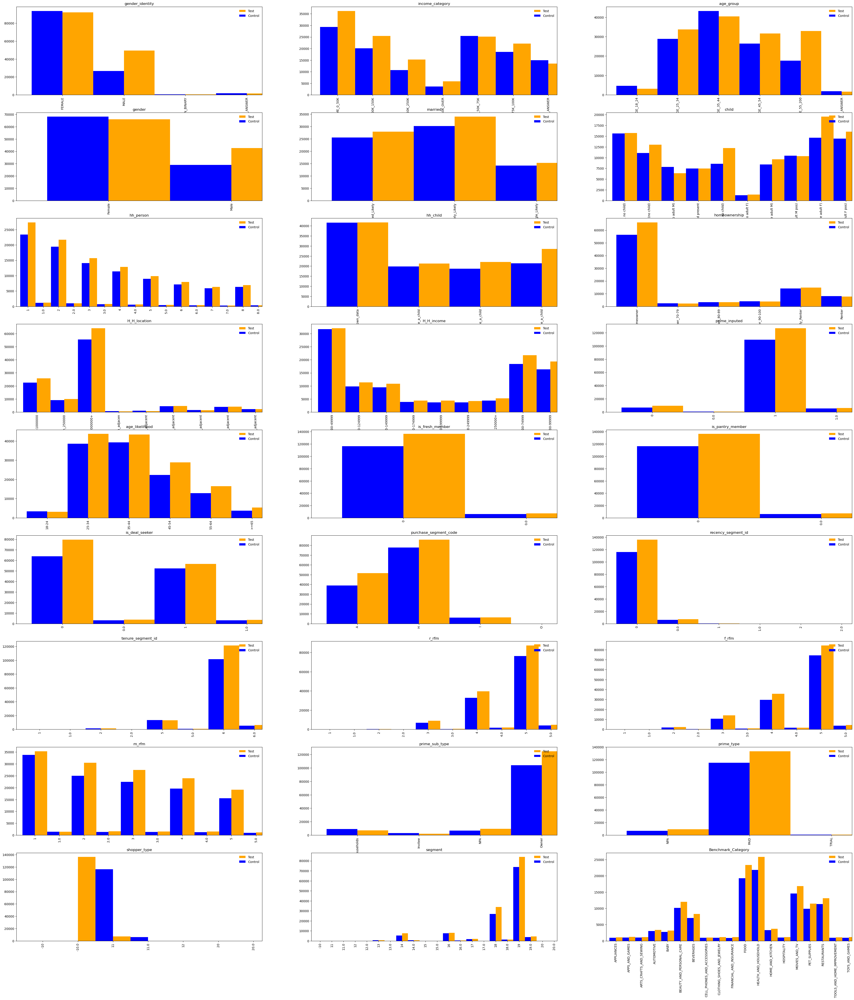

In [29]:
# Plotting - categorical variables
plot_cols = ['gender_identity', 'income_category', 'age_group', 'gender', 'married',
       'child', 'hh_person', 'hh_child', 'homeownership', 'H_H_location',
       'H_H_income', 'prime_inputed', 'age_likelihood',
       'is_fresh_member', 'is_pantry_member','is_deal_seeker', 
       'purchase_segment_code', 'recency_segment_id',
       'tenure_segment_id', 'r_rfm', 'f_rfm', 'm_rfm', 
       'prime_sub_type', 'prime_type', 'shopper_type', 'segment',
       'Benchmark_Category']
for col in plot_cols:
    df_new[col] = df_new[col].astype(str).apply(lambda x: x.split('.')[0])
    
# fig, axes = plt.subplots(ncols=len(plot_cols), figsize=(10,5))
# for col, ax in zip(df_new, axes):
#     df_new[col].value_counts().sort_index().plot.bar(ax=ax, title=col)

# plt.tight_layout()    
# plt.show()


from itertools import combinations

fig, axes = plt.subplots(len(plot_cols)//3, 3, figsize=(48, 54))

i = 0
for triaxis in axes:
    for axis in triaxis:
        df_test[plot_cols[i]].value_counts().sort_index().plot.bar(ax=axis, title=plot_cols[i], position=0,\
                                                                   color = 'orange', label = 'Test')
        df_control[plot_cols[i]].value_counts().sort_index().plot.bar(ax=axis, title=plot_cols[i], position=1,\
                                                                   color = 'b', label = 'Control')
        axis.legend(loc='upper right', frameon=False)
        i = i+1

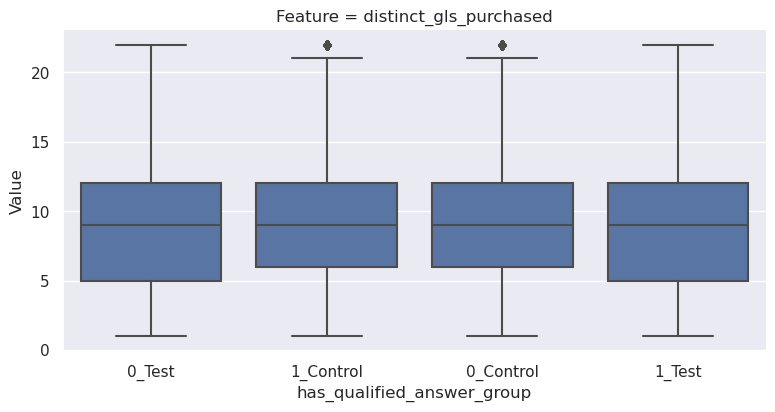

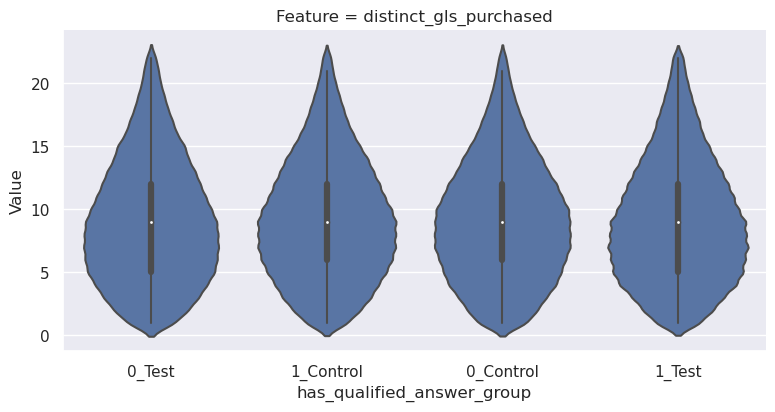

In [33]:
# Plotting - numerical variables
df_new.has_qualified_answer = df_new.has_qualified_answer.astype(int)
plot_cols = ["distinct_gls_purchased"]
# ["total_t12m_gms","ops_static_t7d","distinct_gls_purchased"]

# standard_deviations = 3
# df[df.apply(lambda x: np.abs(x - x.mean()) / x.std() < standard_deviations)
#    .all(axis=1)]

# remove outliers
for col in plot_cols:
    df_new[col] = df_new[col].astype('float32')
    q_hi = df_new[col].quantile(0.99)
    q_low = df_new[col].quantile(0.01)
    df_new_filtered = df_new[(df_new[col] < q_hi) & (df_new[col] > q_low)]
    df_new_filtered.Type = df_new_filtered.Type.astype(str)
    df_new_filtered['has_qualified_answer_group'] = df_new_filtered[df_new_filtered['Type']!='None'][['has_qualified_answer','Type']]\
                                                        .apply(lambda x: '_'.join(x.astype(str)), axis=1)

sns.set()
df_temp = pd.melt(df_new_filtered,id_vars='has_qualified_answer_group',value_vars=plot_cols, 
                  var_name="Feature", value_name="Value")
g = sns.FacetGrid(data = df_temp, col="Feature", col_wrap=len(plot_cols), sharey = False)
g.map(sns.boxplot,"has_qualified_answer_group", "Value");
g.fig.set_figwidth(10)
g.fig.set_figheight(5)
g = sns.FacetGrid(data = df_temp, col="Feature", col_wrap=len(plot_cols), sharey = False)
g.map(sns.violinplot,"has_qualified_answer_group", "Value")
g.fig.set_figwidth(10)
g.fig.set_figheight(5)

In [ ]:
# profiling
profile = ProfileReport(df_new)
profile

# profile.to_file("s3://survey-analysis/adsp_bl_model/Analysis.html")

# profile.to_widgets()

In [4]:
def data_preprocessing(df, target, group):
    if target == "has_qualified_answer":
        df_test= df[(df.Type == "Test") & (df.question_sequence_number == "1")]
        df_control= df[(df.Type == "Control") & (df.question_sequence_number == "1")]
    elif target == "label":
        df_test= df[(df[target] == 1)]
        df_control= df[(df[target] == 0)]
        
    print()
    print("/----- EDA -----/")
    print("Raw data shape", df.shape)
    print("Test data shape", df_test.shape)
    print("Control data shape", df_control.shape)
    
    drop_cols = ['label','customer_decoration_key','obfuscated_id','test_group_selected','Type',\
                'rawPrediction','Survey','create_date_in_millis', 'last_updated_date_in_millis', 'region_id', 'spektr_date',\
                'Study_Status','Status','SurveyId','Reward_Amount','question_text','has_qualified_answer','Created_Date',\
                 'Benchmark_Category','question_sequence_number']
    if group == "Test":
        X = df_test.drop(drop_cols,axis = 1, errors='ignore')
        y = df_test[target].astype(int)
    elif group == "Control":
        X = df_control.drop(drop_cols,axis = 1, errors='ignore')
        y = df_control[target].astype(int)
    elif group == "All":
        X = df.drop(drop_cols,axis = 1, errors='ignore')
        y = df[target].astype(int)
        
    print("Total number of X variables:",len(X.columns))
    print(X.columns)
    print("Total number of y variables:")
    print(y.value_counts())
    
    #### Missing values
    print()
    print("/----- Missing values -----/")
    print("X missing values:")
    print(X.isna().sum()/X.count().max()*100)
    print("y missing values:")
    print(y.isna().sum())
    
    #### Numerical vs Categorical variables
    print()
    print("/----- Variable Types -----/")
    # numerical_ix = X.select_dtypes(include=['int64', 'float64']).columns
    # categorical_ix = X.select_dtypes(include=['object', 'bool']).columns
    numerical_ix = ["total_t12m_gms","ops_static_t7d","distinct_gls_purchased"]
    categorical_ix = X.drop(columns = numerical_ix).columns

    print("numerical variables: {}, categorical variables: {}".format(len(numerical_ix), len(categorical_ix)))
    
    #### Fill NA
    print()
    print("/----- Fill NA -----/")
    # Fill numerical na with mean
    # X[numerical_ix] = X[numerical_ix].apply(lambda x: x.fillna(x.value_counts().index[0])) # fill most common value
    X[numerical_ix] = X[numerical_ix].apply(lambda x: x.astype('float32').fillna(x.astype('float32').mean()))

    # Fill categorical na with existing distribution 
    # X[categorical_ix] = X[categorical_ix].fillna("unknown")
    for i in categorical_ix:
        X[i] = X[i].astype(str).apply(lambda x: x.split('.')[0])
        num_na = X[i].isna().sum() # number of missing cases
        num_none = len(X.loc[X[i]=='None', i]) # number of missing cases
    #     X.loc[X[i].isna(), i] = np.random.choice(X[i].dropna().notnull().unique().tolist(), size=num_na,\
    #                                              p=X[i].dropna().notnull().value_counts(normalize = True)) # fill na with current prob
        X.loc[X[i]=='None', i] = np.random.choice(X.loc[X[i]!='None', i].unique().tolist(), size=num_none,\
                                                 p=X.loc[X[i]!='None', i].value_counts(normalize = True)) # fill na with current prob
        X[i] = X[i].astype('category')
        
    print("NA left after processing:",X.isna().sum().sum())    
        
  
    #### Encoding
    print()
    print("/----- Encoding -----/")
    # Normalize numerical vars and Encode categorical vars
    t = [('num', MinMaxScaler(), numerical_ix), ('cat', OneHotEncoder(sparse = False), categorical_ix)]
    # t = [('cat', LabelEncoder(), categorical_ix), ('num', MinMaxScaler(), numerical_ix)]
    print(t)
    
    encoder = OneHotEncoder(sparse = False)
    cate_trans = encoder.fit_transform(X[categorical_ix])
    cate_names = encoder.get_feature_names(categorical_ix).tolist()
    print(cate_names)

    num_names = X[numerical_ix].columns.tolist()
    print(num_names)
    
    col_names = num_names + cate_names
    print("Total number of columns after encoding:",len(col_names))
    
    print()
    print("/----- Processed Data -----/")
    # Transform X input variables
    X = X.reindex(columns = numerical_ix + categorical_ix.tolist())
    col_transform = ColumnTransformer(transformers=t)
    X_transformed = col_transform.fit_transform(X)
    print("Processed data shape", X_transformed.shape, y.shape)
    # pd.get_dummies(X[categorical_ix], columns=categorical_ix, prefix=categorical_ix)
    # pd.DataFrame(X_transformed.toarray(), columns=X_transformed.categories_).head()

    return X, y, X_transformed, col_names

In [85]:
# 122 ADSP response data
X, y, X_transformed, col_names = data_preprocessing(df_new, "has_qualified_answer","Test")


/----- EDA -----/
Raw data shape (268526, 49)
Test data shape (143590, 49)
Control data shape (122683, 49)
Total number of X variables: 30
Index(['gender_identity', 'income_category', 'age_group', 'gender', 'married',
       'child', 'hh_person', 'hh_child', 'homeownership', 'H_H_location',
       'H_H_income', 'prime_inputed', 'age_likelihood',
       'distinct_gls_purchased', 'is_fresh_member', 'is_pantry_member',
       'is_deal_seeker', 'purchase_segment_code', 'recency_segment_id',
       'tenure_segment_id', 'r_rfm', 'f_rfm', 'm_rfm', 'total_t12m_gms',
       'prime_sub_type', 'prime_type', 'shopper_type', 'segment',
       'ops_static_t7d', 'Benchmark_Category'],
      dtype='object')
Total number of y variables:
1    83909
0    59681
Name: has_qualified_answer, dtype: int64

/----- Missing values -----/
X missing values:
gender_identity            0.000000
income_category            0.000000
age_group                  0.000000
gender                    24.273975
married       

In [5]:
# 122 ADSP label data
X, y, X_transformed, col_names = data_preprocessing(df, "label", "All")


/----- EDA -----/
Raw data shape (47221061, 46)
Test data shape (1804157, 46)
Control data shape (45416904, 46)
Total number of X variables: 29
Index(['gender_identity', 'income_category', 'age_group', 'gender', 'married',
       'child', 'hh_person', 'hh_child', 'homeownership', 'H_H_location',
       'H_H_income', 'prime_inputed', 'age_likelihood',
       'distinct_gls_purchased', 'is_fresh_member', 'is_pantry_member',
       'is_deal_seeker', 'purchase_segment_code', 'recency_segment_id',
       'tenure_segment_id', 'r_rfm', 'f_rfm', 'm_rfm', 'total_t12m_gms',
       'prime_sub_type', 'prime_type', 'shopper_type', 'segment',
       'ops_static_t7d'],
      dtype='object')
Total number of y variables:
0    45416904
1     1804157
Name: label, dtype: int64

/----- Missing values -----/
X missing values:
gender_identity            0.000000
income_category            0.000000
age_group                  0.000000
gender                    37.352098
married                   55.102459
chil

In [49]:
# Split training and testing data
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.2, random_state=42)

## Evaluation Metrics

In [6]:
# Evaluating model
def eva_model(X, y, model, model_name, kfold=10, n_row=0):
    # # Split training and testing data
    # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_test = X
    y_test = y
    
    scoring = ['r2','accuracy','precision','recall','f1']
    scoring_names = {'r2':'R2','accuracy':'Accuracy','precision':'Precision','recall':'Recall','f1':'F1'}
    score_res = [model_name]
    eva_metrics = pd.DataFrame(columns = ['model']+ list(scoring_names.values()))
    
    #Cross validation on training set
#     for score in scoring:
#         # for mod in model:
#         result = cross_val_score(model, X=X_train, y=y_train,cv=kfold, scoring=score, n_jobs=-1)
#         print('Mean %s: %.3f (%.3f)' % (scoring_names[score], absolute(result.mean()), std(result)))
#         score_res.append(absolute(result.mean()))

#     eva_metrics.loc[0] = score_res
        
    # Final evaluation on test set
    prediction_probs = model.predict(X_test)
    prediction_classes = [int(p>=0.5) for p in prediction_probs]
    
    r2 = r2_score(y_test, prediction_classes)
    score_res.append(r2)
    print('R2 Score of test set : %f' % r2)
    
    accuracy = accuracy_score(y_test, prediction_classes)
    score_res.append(accuracy)
    print('Accuracy: %f' % accuracy)
    
    # precision tp / (tp + fp)
    precision = precision_score(y_test, prediction_classes)
    score_res.append(precision)
    print('Precision: %f' % precision)
    
    # recall: tp / (tp + fn)
    recall = recall_score(y_test, prediction_classes)
    score_res.append(recall)
    print('Recall: %f' % recall)
    
    # f1: 2 tp / (2 tp + fp + fn)
    f1 = f1_score(y_test, prediction_classes)
    score_res.append(f1)
    print('F1 score: %f' % f1)
    
    eva_metrics.loc[n_row] = score_res
        
    return eva_metrics

In [7]:
# SHAP explainer
# explain the model's predictions using SHAP values
# https://shap.readthedocs.io/en/latest/example_notebooks/overviews/An%20introduction%20to%20explainable%20AI%20with%20Shapley%20values.html

def shap_explainer(X, model, model_type, feature_names, max_features = 20):
    
    if model_type == "Linear":
        # explain the model's predictions using SHAP
        explainer = shap.explainers.Linear(model, X)
        shap_values = explainer(X)
    elif model_type == "Tree":
        explainer = shap.TreeExplainer(model)
        shap_values = explainer(X)

    # we add back the feature names stripped by the StandardScaler
    shap_values.feature_names = feature_names

    # we convert back to the original data
    # (note we can do this because X_std is a set of univariate transformations of X)
    # shap_values.data = X

#     # visualize the model's dependence on the first feature
#     shap.plots.scatter(shap_values[:, 0])

#     # visualize the first observation's explanation
#     shap.plots.waterfall(shap_values[0],max_display=max_features)

    # visualize feature importance to target
    shap.plots.beeswarm(shap_values,max_display=max_features)
    
    # visualize feature importance to target in bar
    shap.plots.bar(shap_values, max_display = max_features)
    
    # # Dependence Plots
    # for name in X_train.columns:
    # shap.dependence_plot(name, shap_values, X, display_features=X_display)

## Feature Selection Models

In [8]:
def feature_selection_model(df, target, group, num_feats):
    # Split training and testing data
    X, y, X_transformed, col_names = data_preprocessing(df, target, group)
    X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.2, random_state=42)
    
    print()
    print("/---- Feature Selection Model ----/")
    
    #### LASSO   
    print()
    print("/---- LASSO ----/")
    regressor = linear_model.Lasso(alpha = 0.00001,
    #                                alpha=search.best_params_['alpha'],
                                   positive=True,
                                   fit_intercept=False, 
                                   max_iter=1000,
                                   tol=0.0001)
    lassomodel = regressor.fit(X_train, y_train)
    # Feature importance
    display(eli5.show_weights(lassomodel, top=num_feats, feature_names = col_names))
    # Evaluation
    n_row = 0
    eva_metrics = eva_model(X_test,y_test,lassomodel,"LASSO",n_row = n_row)
    # SHAP plot
    shap_explainer(X_train, lassomodel,"Linear", col_names, max_features=num_feats)

    #### LASSO LARS
    print()
    print("/---- LASSO LARS ----/")
    try:
        regressor= linear_model.LassoLarsCV(cv= 5)
        lassolarsmodel = regressor.fit(X_train, y_train)
    except:
        regressor= linear_model.LassoLars(alpha = 0.00001,
                                          max_iter=1000)
        lassolarsmodel = regressor.fit(X_train, y_train)
    # Feature importance
    display(eli5.show_weights(lassolarsmodel, top=num_feats, feature_names = col_names))
    # Evaluation
    n_row = 1
    eva_metrics = pd.concat([eva_metrics,eva_model(X_test,y_test,lassolarsmodel,"LASSO LARS",n_row = n_row)])
    # SHAP plot
    shap_explainer(X_train, lassolarsmodel,"Linear", col_names, max_features=num_feats)
    
    #### Logistic Regression RFE
    print()
    print("/---- Logistic Regression RFE ----/")
    rfe_selector = RFE(estimator=LogisticRegression(max_iter=1000), n_features_to_select=num_feats, step=10, verbose=5)
    rfemodel = rfe_selector.fit(X_train,y_train)
    # pipeline = Pipeline(steps=[('s',rfe_selector),('m',rfemodel)])
    rfe_support = rfe_selector.get_support()
    rfe_feature = [x for x, y in zip(col_names, rfe_support.tolist()) if y == True]
    print(str(len(rfe_feature)), 'selected features')
    
    most_important_names = [rfe_feature[i] for i in range(num_feats)]
    zipped_feats = zip(most_important_names,rfe_selector.estimator_.coef_[0])
    zipped_feats = sorted(zipped_feats, key=lambda x: x[1], reverse=False)
    features, importances = zip(*zipped_feats)
    top_features = features[:num_feats]
    top_importances = importances[:num_feats]

    fig, ax = plt.subplots(figsize=(15,20))
    plt.title('Feature Importances - RFE Logistic regression')
    plt.barh(range(len(top_importances)), top_importances, color='b', align='center')
    plt.yticks(range(len(top_importances)), top_features)
    plt.xlabel('Feature Coefficients')
    plt.show()
    
    # Evaluation
    n_row = 2
    eva_metrics = pd.concat([eva_metrics,eva_model(X_test,y_test,rfemodel,"RFE - Logistic Regression",n_row = n_row)])
    
    #### XGBoost
    print()
    print("/---- XGBoost ----/")
    # create a train/test split
    d_train = xgboost.DMatrix(X_train, label=y_train, feature_names=col_names, enable_categorical=True)
    d_test = xgboost.DMatrix(X_test, label=y_test, feature_names=col_names, enable_categorical=True)

    params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y_train.astype(int)),
    "eval_metric": "logloss"
    }
    xgmodel = xgboost.train(params, d_train, 1000, evals = [(d_test, "test")], verbose_eval=100, early_stopping_rounds=20)
    
    # traditional plot
    xgboost.plot_importance(xgmodel,max_num_features=30)
    plt.title("Feature Importances - XGBoost")
    plt.show()
    
    # SHAP plot
    shap_explainer(X_train, xgmodel, "Tree", col_names, max_features = num_feats)
    
    # Evaluation
    n_row = 3
    eva_metrics = pd.concat([eva_metrics,eva_model(d_test,y_test,xgmodel,"XGBoost",n_row = n_row)])

    return eva_metrics 
    


/----- EDA -----/
Raw data shape (268526, 49)
Test data shape (143590, 49)
Control data shape (122683, 49)
Total number of X variables: 30
Index(['gender_identity', 'income_category', 'age_group', 'gender', 'married',
       'child', 'hh_person', 'hh_child', 'homeownership', 'H_H_location',
       'H_H_income', 'prime_inputed', 'age_likelihood',
       'distinct_gls_purchased', 'is_fresh_member', 'is_pantry_member',
       'is_deal_seeker', 'purchase_segment_code', 'recency_segment_id',
       'tenure_segment_id', 'r_rfm', 'f_rfm', 'm_rfm', 'total_t12m_gms',
       'prime_sub_type', 'prime_type', 'shopper_type', 'segment',
       'ops_static_t7d', 'Benchmark_Category'],
      dtype='object')
Total number of y variables:
1    83909
0    59681
Name: has_qualified_answer, dtype: int64

/----- Missing values -----/
X missing values:
gender_identity            0.000000
income_category            0.000000
age_group                  0.000000
gender                    24.273975
married       

Weight?,Feature
+0.387,Benchmark_Category_RESTAURANTS
+0.292,Benchmark_Category_CLOTHING_SHOES_AND_JEWELRY
+0.264,Benchmark_Category_AUTOMOTIVE
+0.254,Benchmark_Category_BABY
+0.219,gender_Male
+0.219,gender_Female
+0.203,Benchmark_Category_CELL_PHONES_AND_ACCESSORIES
+0.170,Benchmark_Category_MOVIES_AND_TV
+0.161,Benchmark_Category_BEAUTY_AND_PERSONAL_CARE
+0.141,Benchmark_Category_APPLIANCES


R2 Score of test set : -0.539591
Accuracy: 0.626060
Precision: 0.648985
Recall: 0.784290
F1 score: 0.710251


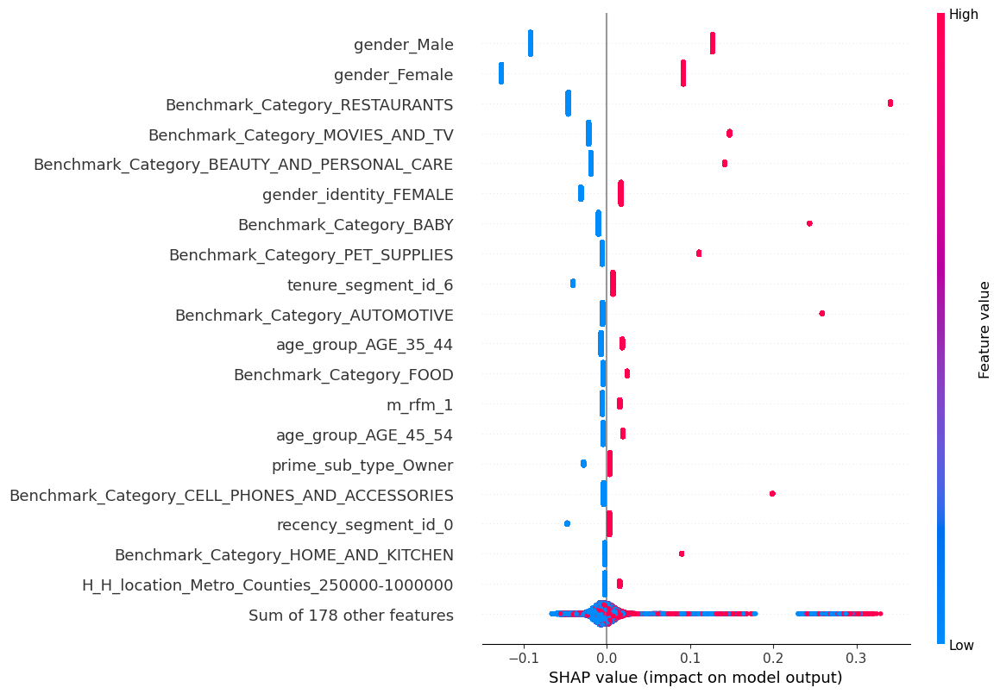

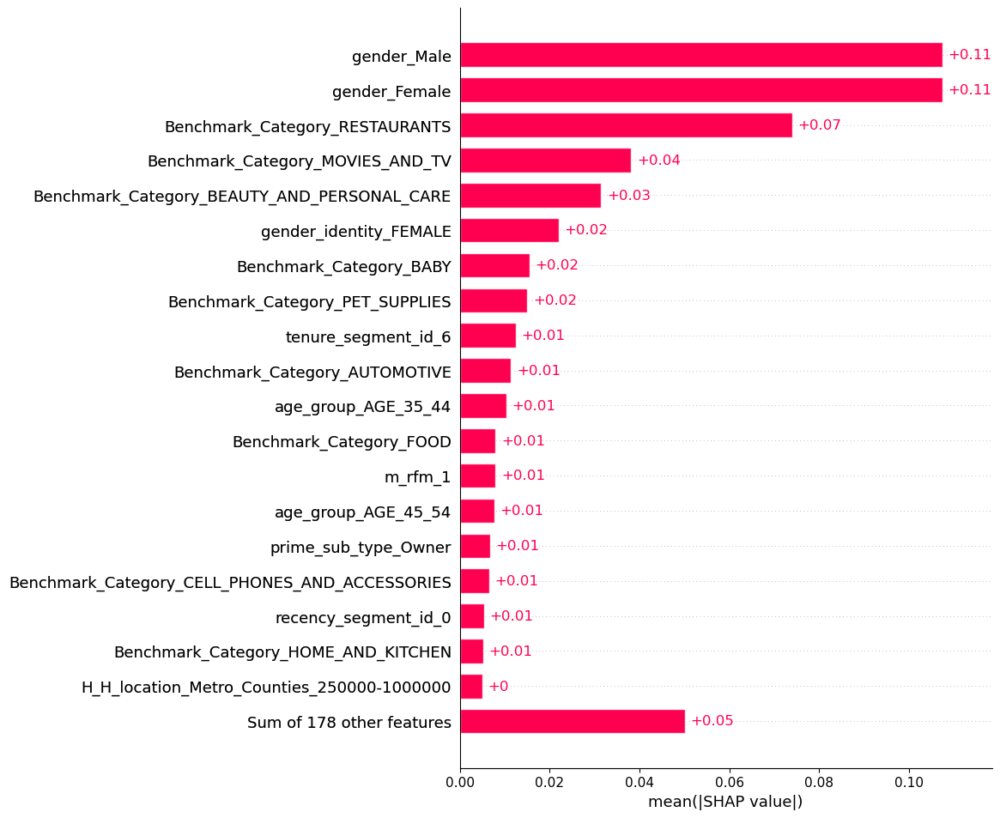


/---- LASSO LARS ----/


Weight?,Feature
+0.522,<BIAS>
+0.265,Benchmark_Category_RESTAURANTS
+0.265,Benchmark_Category_CLOTHING_SHOES_AND_JEWELRY
+0.169,Benchmark_Category_AUTOMOTIVE
+0.160,Benchmark_Category_BABY
+0.141,Benchmark_Category_CELL_PHONES_AND_ACCESSORIES
+0.126,recency_segment_id_1.0
+0.117,segment_15.0
+0.115,Benchmark_Category_APPLIANCES
+0.105,tenure_segment_id_2.0


R2 Score of test set : -0.505900
Accuracy: 0.634243
Precision: 0.660049
Recall: 0.771395
F1 score: 0.711391


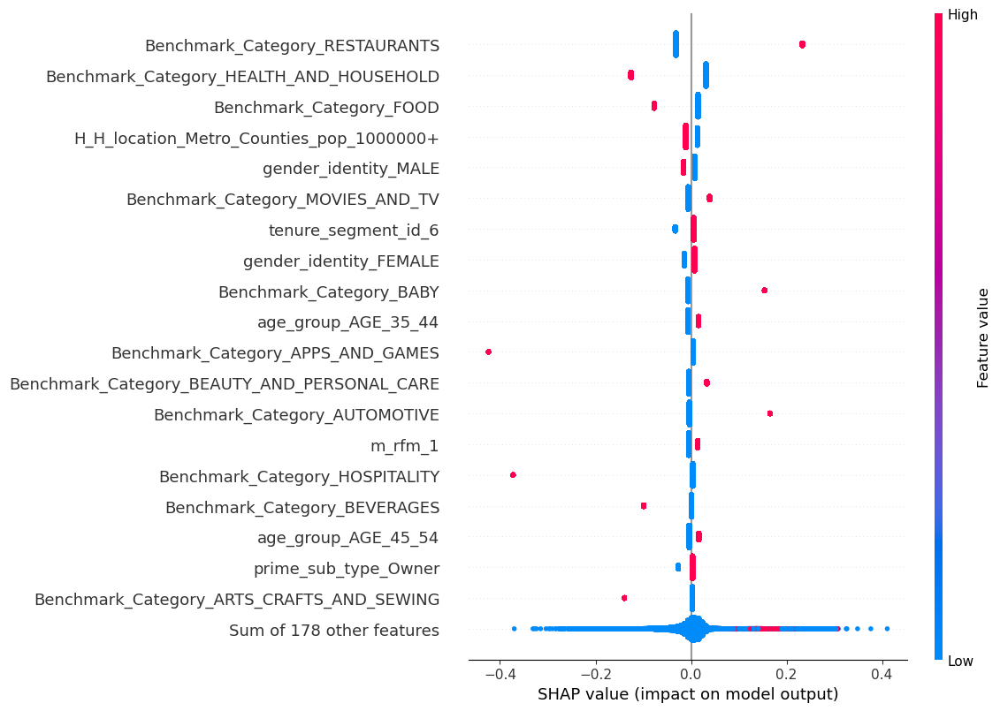

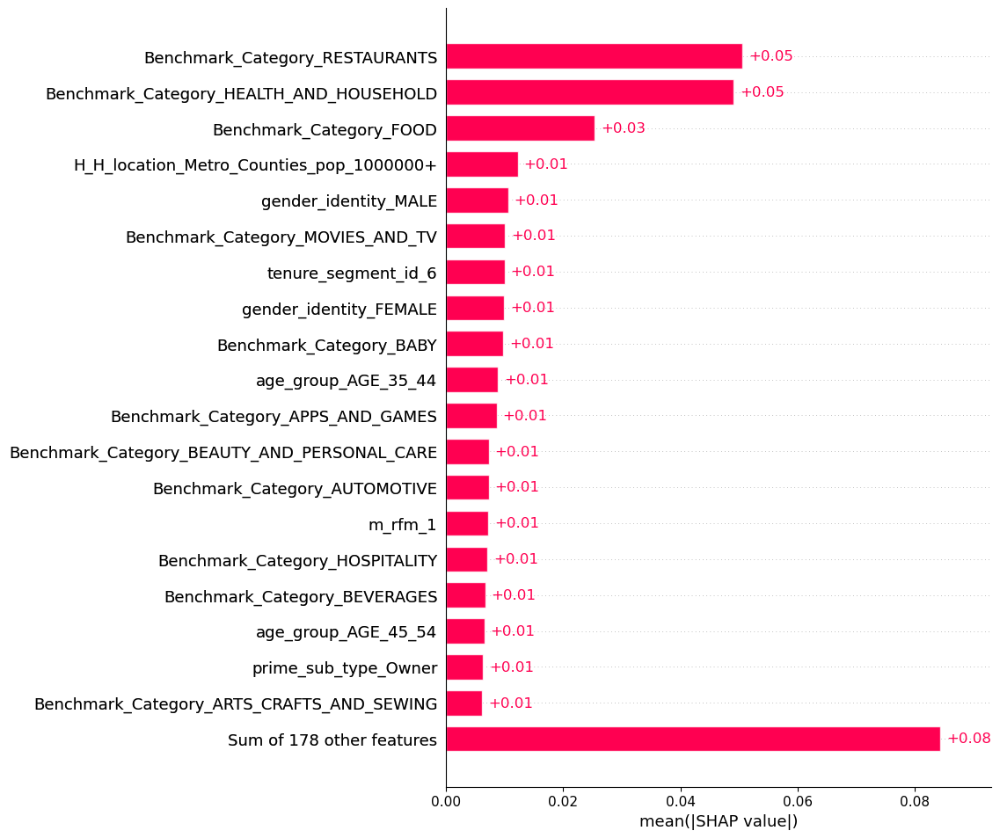


/---- Logistic Regression RFE ----/
Fitting estimator with 197 features.
Fitting estimator with 187 features.
Fitting estimator with 177 features.
Fitting estimator with 167 features.
Fitting estimator with 157 features.
Fitting estimator with 147 features.
Fitting estimator with 137 features.
Fitting estimator with 127 features.
Fitting estimator with 117 features.
Fitting estimator with 107 features.
Fitting estimator with 97 features.
Fitting estimator with 87 features.
Fitting estimator with 77 features.
Fitting estimator with 67 features.
Fitting estimator with 57 features.
Fitting estimator with 47 features.
Fitting estimator with 37 features.
Fitting estimator with 27 features.
20 selected features


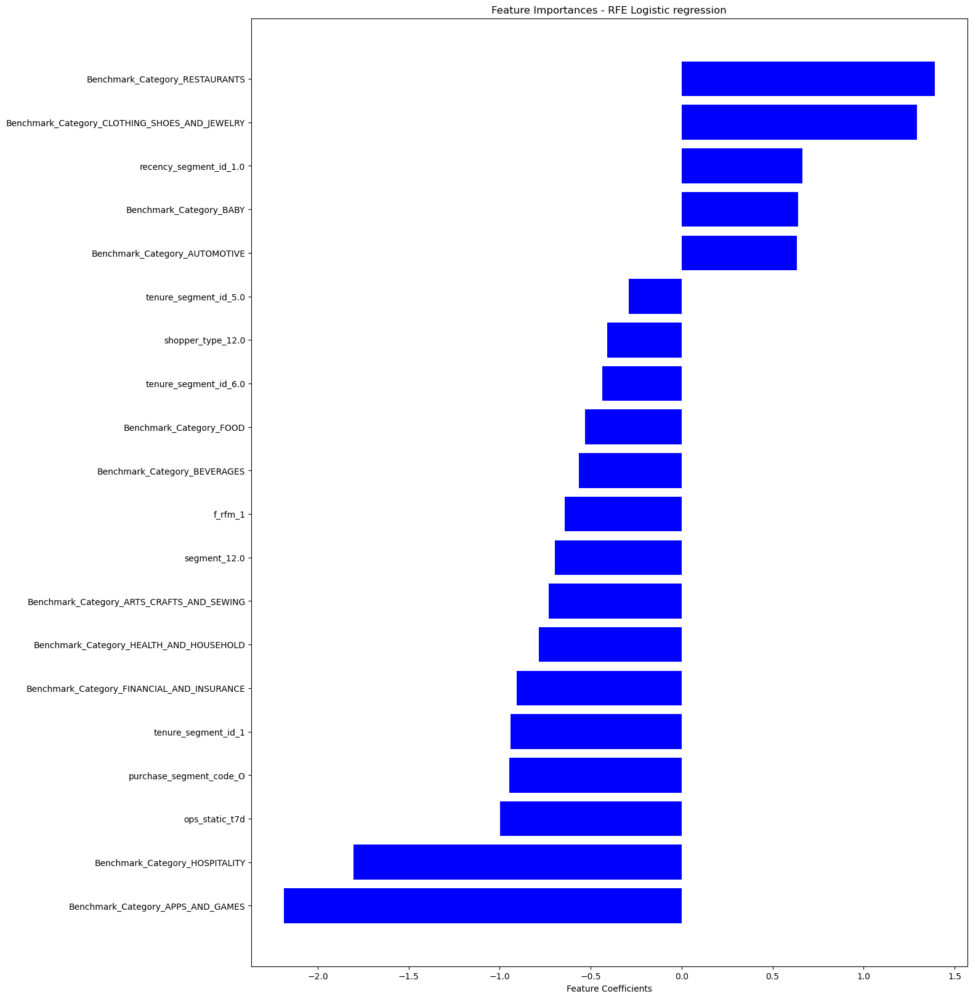

R2 Score of test set : -0.551863
Accuracy: 0.623080
Precision: 0.637947
Recall: 0.820842
F1 score: 0.717929

/---- XGBoost ----/
[0]	test-logloss:0.67738
[100]	test-logloss:0.64083
[200]	test-logloss:0.63064
[300]	test-logloss:0.62632
[400]	test-logloss:0.62400
[500]	test-logloss:0.62260
[600]	test-logloss:0.62166
[700]	test-logloss:0.62096
[800]	test-logloss:0.62034
[900]	test-logloss:0.61999
[999]	test-logloss:0.61962


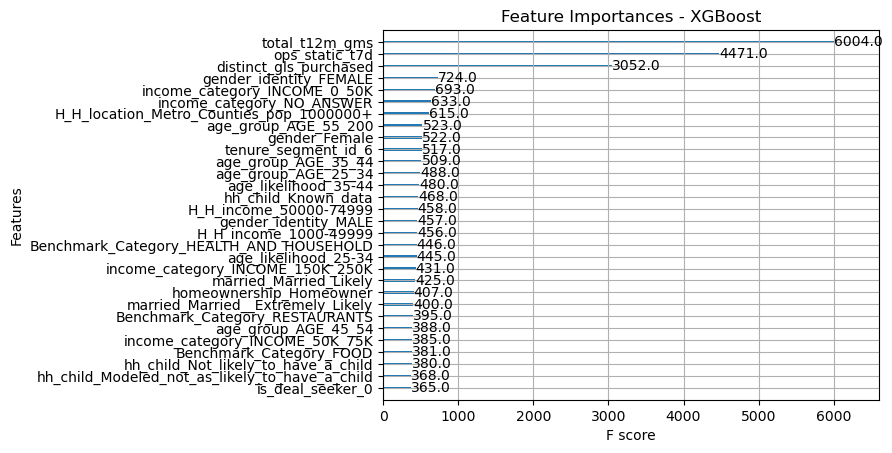

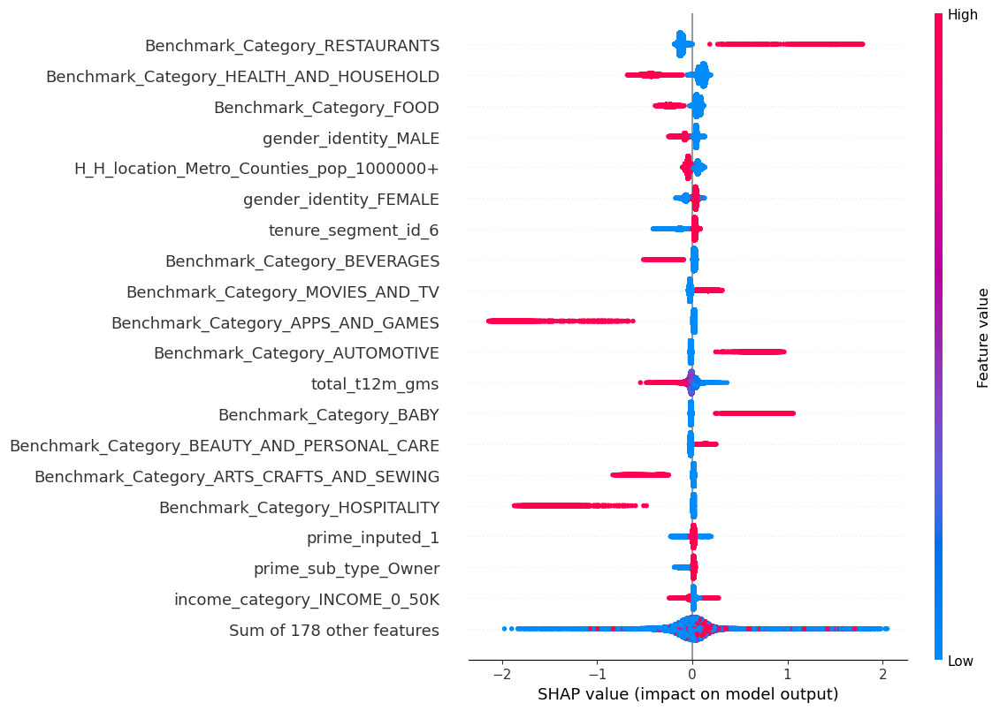

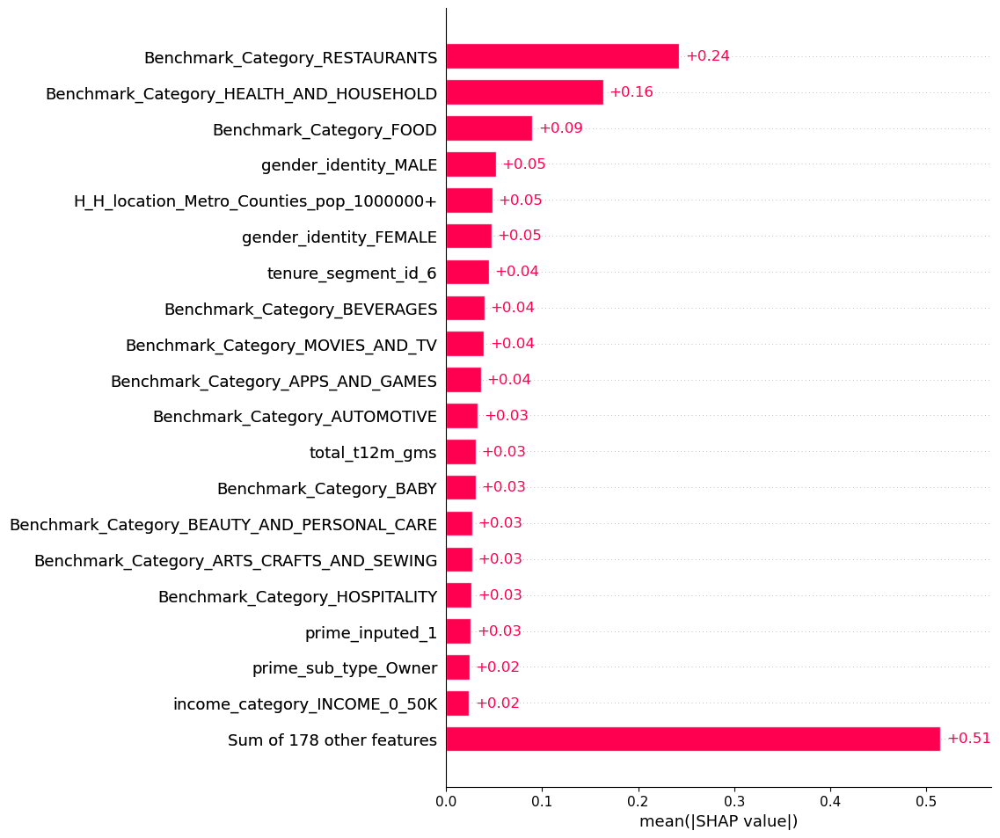

R2 Score of test set : -0.475559
Accuracy: 0.642141
Precision: 0.667466
Recall: 0.776808
F1 score: 0.717998


,model,R2,Accuracy,Precision,Recall,F1
0,LASSO,-0.539591,0.626060,0.648985,0.784290,0.710251
1,LASSO LARS,-0.505900,0.634243,0.660049,0.771395,0.711391
2,RFE - Logistic Ref,-0.551863,0.623080,0.637947,0.820842,0.717929
3,XGBoost,-0.475559,0.642141,0.667466,0.776808,0.717998


In [130]:
# 122 ADSP response data with Benchmark Category - Test
eva_metrics1 = feature_selection_model(df_new, "has_qualified_answer", "Test", 20)
eva_metrics1


/----- EDA -----/
Raw data shape (268526, 49)
Test data shape (143590, 49)
Control data shape (122683, 49)
Total number of X variables: 30
Index(['gender_identity', 'income_category', 'age_group', 'gender', 'married',
       'child', 'hh_person', 'hh_child', 'homeownership', 'H_H_location',
       'H_H_income', 'prime_inputed', 'age_likelihood',
       'distinct_gls_purchased', 'is_fresh_member', 'is_pantry_member',
       'is_deal_seeker', 'purchase_segment_code', 'recency_segment_id',
       'tenure_segment_id', 'r_rfm', 'f_rfm', 'm_rfm', 'total_t12m_gms',
       'prime_sub_type', 'prime_type', 'shopper_type', 'segment',
       'ops_static_t7d', 'Benchmark_Category'],
      dtype='object')
Total number of y variables:
1    65894
0    56789
Name: has_qualified_answer, dtype: int64

/----- Missing values -----/
X missing values:
gender_identity            0.000000
income_category            0.000000
age_group                  0.000000
gender                    20.856190
married       

Weight?,Feature
+0.412,Benchmark_Category_RESTAURANTS
+0.389,Benchmark_Category_CLOTHING_SHOES_AND_JEWELRY
+0.307,Benchmark_Category_CELL_PHONES_AND_ACCESSORIES
+0.293,Benchmark_Category_AUTOMOTIVE
+0.264,Benchmark_Category_BABY
+0.200,Benchmark_Category_BEAUTY_AND_PERSONAL_CARE
+0.190,Benchmark_Category_APPLIANCES
+0.158,Benchmark_Category_MOVIES_AND_TV
+0.145,Benchmark_Category_HOME_AND_KITCHEN
+0.119,Benchmark_Category_TOOLS_AND_HOME_IMPROVEMENT


R2 Score of test set : -0.460995
Accuracy: 0.636763
Precision: 0.659270
Recall: 0.669985
F1 score: 0.664584


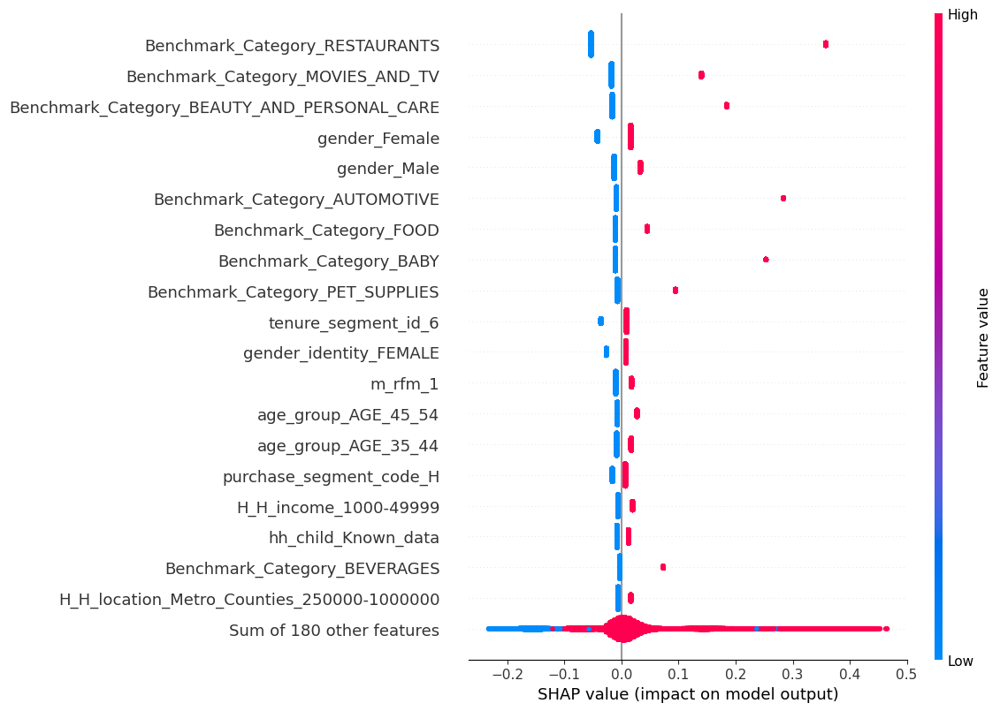

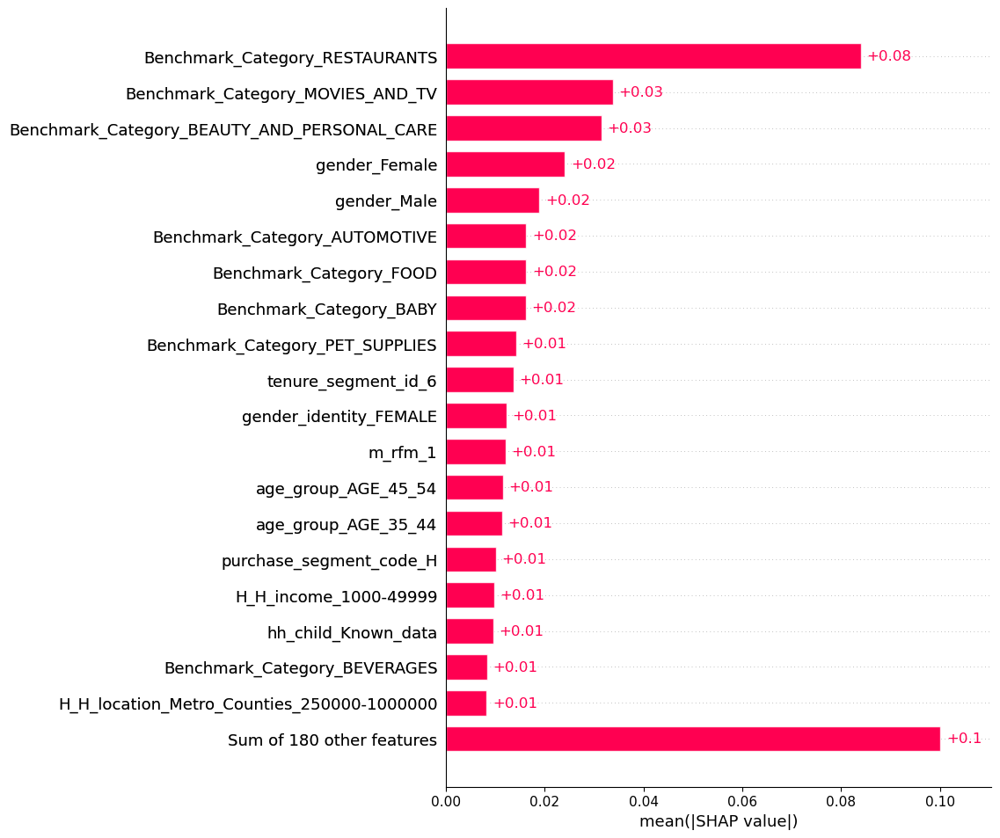


/---- LASSO LARS ----/


Weight?,Feature
+0.453,<BIAS>
+0.328,Benchmark_Category_CLOTHING_SHOES_AND_JEWELRY
+0.254,Benchmark_Category_RESTAURANTS
+0.252,Benchmark_Category_CELL_PHONES_AND_ACCESSORIES
+0.159,Benchmark_Category_AUTOMOTIVE
+0.137,Benchmark_Category_BABY
+0.130,Benchmark_Category_APPLIANCES
+0.092,shopper_type_12
+0.080,shopper_type_20
+0.061,Benchmark_Category_TOYS_AND_GAMES


R2 Score of test set : -0.447225
Accuracy: 0.640186
Precision: 0.654435
Recall: 0.699396
F1 score: 0.676169


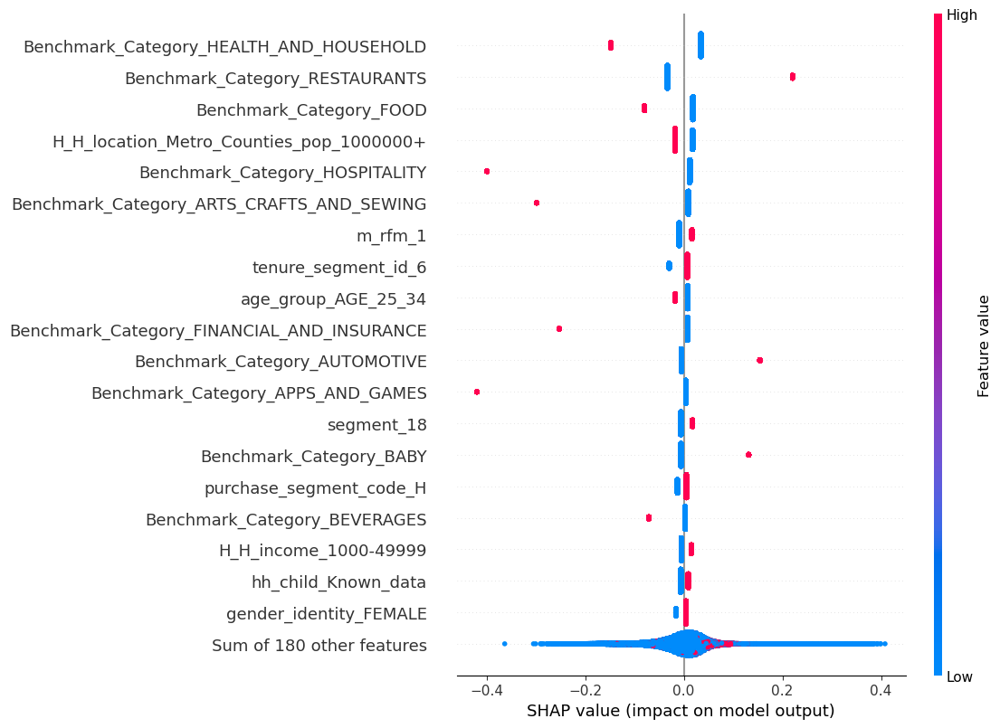

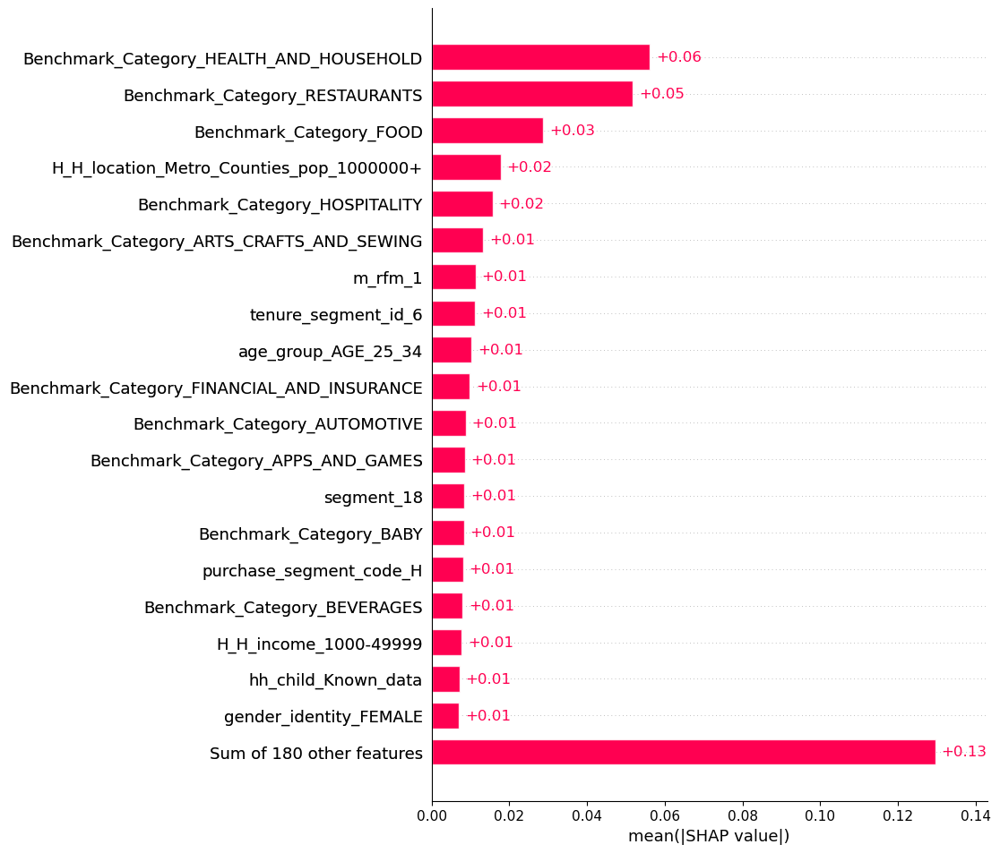


/---- Logistic Regression RFE ----/
Fitting estimator with 199 features.
Fitting estimator with 189 features.
Fitting estimator with 179 features.
Fitting estimator with 169 features.
Fitting estimator with 159 features.
Fitting estimator with 149 features.
Fitting estimator with 139 features.
Fitting estimator with 129 features.
Fitting estimator with 119 features.
Fitting estimator with 109 features.
Fitting estimator with 99 features.
Fitting estimator with 89 features.
Fitting estimator with 79 features.
Fitting estimator with 69 features.
Fitting estimator with 59 features.
Fitting estimator with 49 features.
Fitting estimator with 39 features.
Fitting estimator with 29 features.
20 selected features


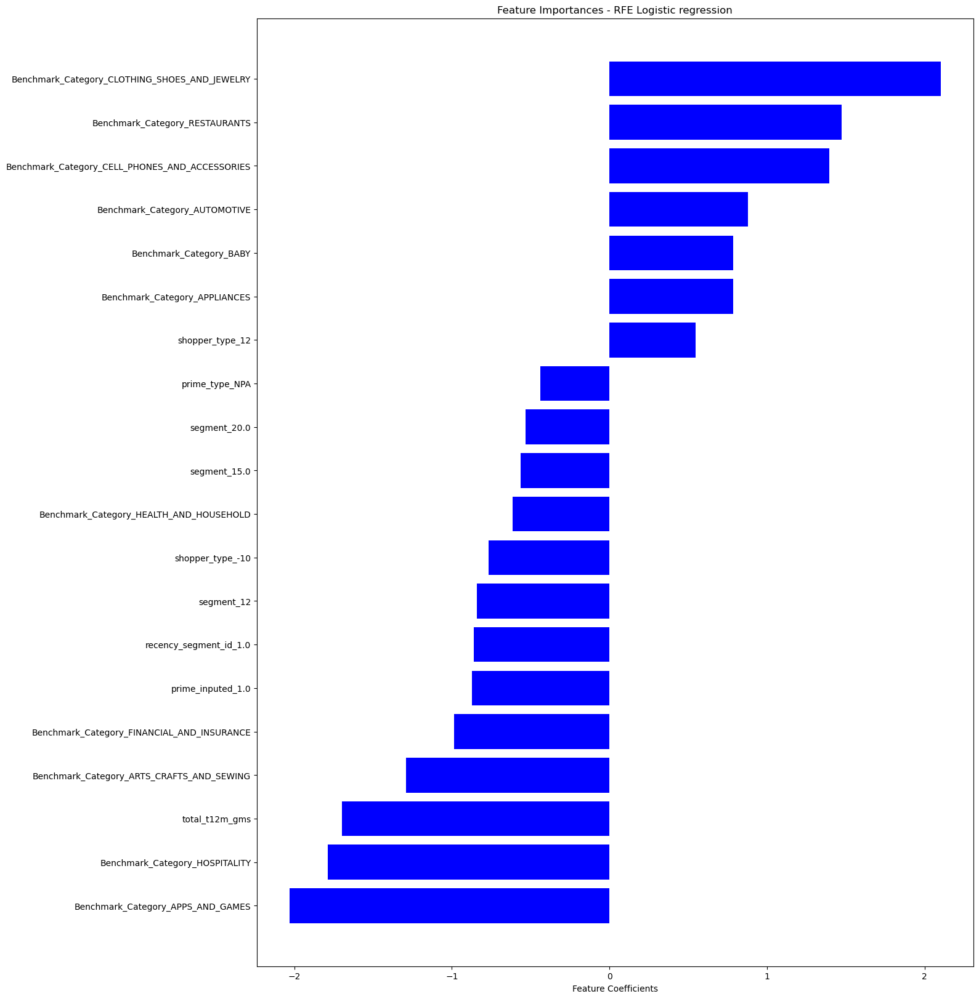

R2 Score of test set : -0.534925
Accuracy: 0.618382
Precision: 0.609849
Recall: 0.803594
F1 score: 0.693443

/---- XGBoost ----/
[0]	test-logloss:0.68946
[100]	test-logloss:0.64533
[200]	test-logloss:0.63188
[300]	test-logloss:0.62597
[400]	test-logloss:0.62272
[500]	test-logloss:0.62079
[600]	test-logloss:0.61962
[700]	test-logloss:0.61888
[800]	test-logloss:0.61831
[900]	test-logloss:0.61794
[999]	test-logloss:0.61776


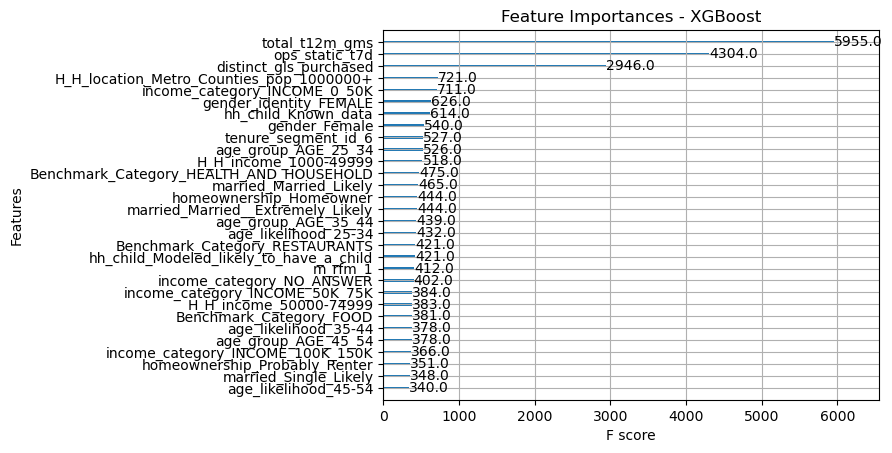

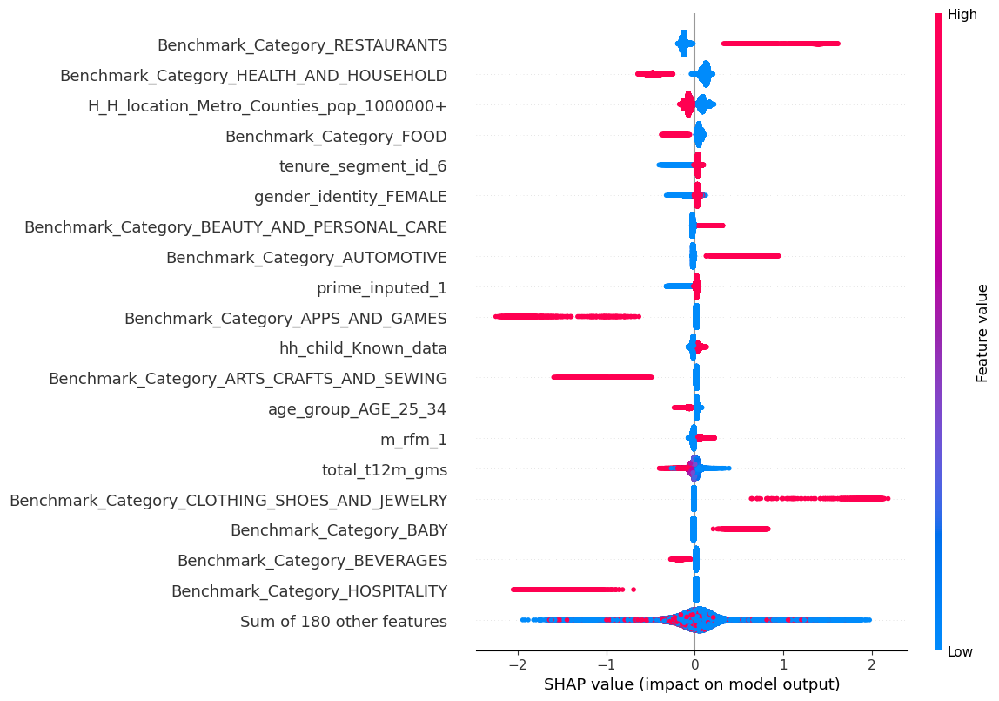

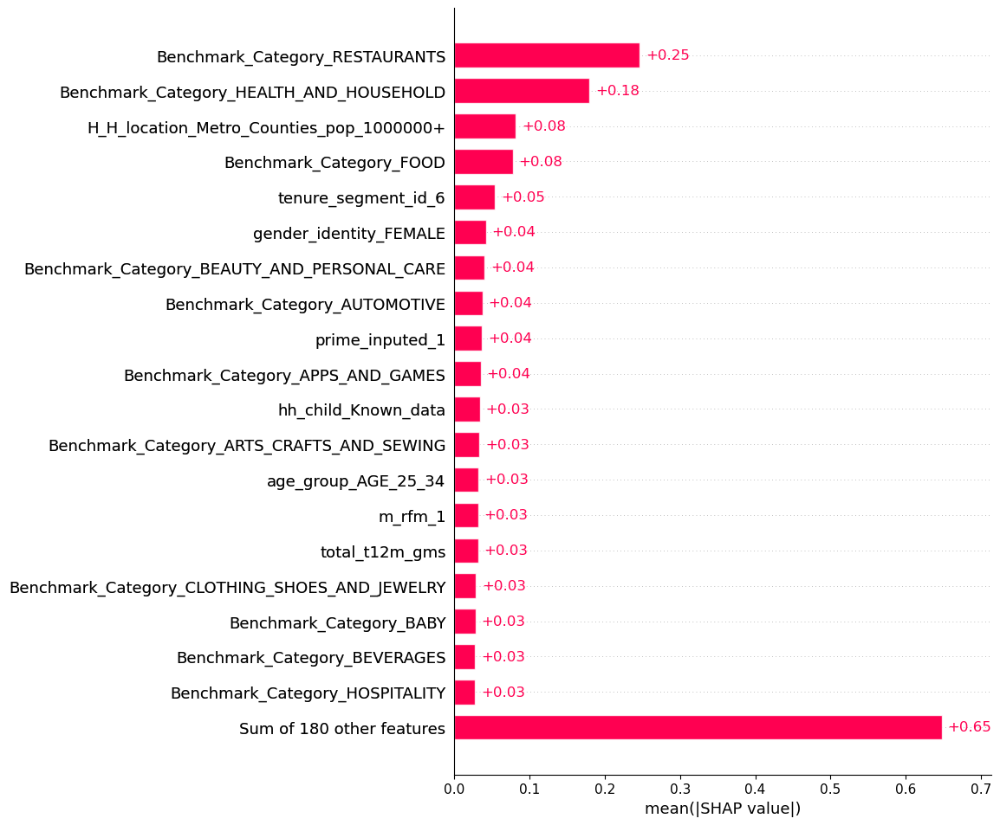

R2 Score of test set : -0.419340
Accuracy: 0.647145
Precision: 0.661898
Recall: 0.701858
F1 score: 0.681293


,model,R2,Accuracy,Precision,Recall,F1
0,LASSO,-0.460995,0.636763,0.659270,0.669985,0.664584
1,LASSO LARS,-0.447225,0.640186,0.654435,0.699396,0.676169
2,RFE - Logistic Ref,-0.534925,0.618382,0.609849,0.803594,0.693443
3,XGBoost,-0.419340,0.647145,0.661898,0.701858,0.681293


In [131]:
# 122 ADSP response data with Benchmark Category - Control 
eva_metrics2 = feature_selection_model(df_new, "has_qualified_answer", "Control", 20)
eva_metrics2


/----- EDA -----/
Raw data shape (268526, 49)
Test data shape (143590, 49)
Control data shape (122683, 49)
Total number of X variables: 29
Index(['gender_identity', 'income_category', 'age_group', 'gender', 'married',
       'child', 'hh_person', 'hh_child', 'homeownership', 'H_H_location',
       'H_H_income', 'prime_inputed', 'age_likelihood',
       'distinct_gls_purchased', 'is_fresh_member', 'is_pantry_member',
       'is_deal_seeker', 'purchase_segment_code', 'recency_segment_id',
       'tenure_segment_id', 'r_rfm', 'f_rfm', 'm_rfm', 'total_t12m_gms',
       'prime_sub_type', 'prime_type', 'shopper_type', 'segment',
       'ops_static_t7d'],
      dtype='object')
Total number of y variables:
1    83909
0    59681
Name: has_qualified_answer, dtype: int64

/----- Missing values -----/
X missing values:
gender_identity            0.000000
income_category            0.000000
age_group                  0.000000
gender                    24.273975
married                   46.239989


Weight?,Feature
+0.375,is_fresh_member_0
+0.045,tenure_segment_id_6
+0.044,prime_sub_type_Owner
+0.040,gender_identity_FEMALE
+0.034,age_group_AGE_35_44
+0.025,recency_segment_id_0
+0.025,m_rfm_1
+0.025,age_group_AGE_45_54
+0.023,H_H_location_Metro_Counties_less_than_250000
+0.023,H_H_location_Metro_Counties_250000-1000000


R2 Score of test set : -0.704424
Accuracy: 0.586636
Precision: 0.589635
Recall: 0.970787
F1 score: 0.733661


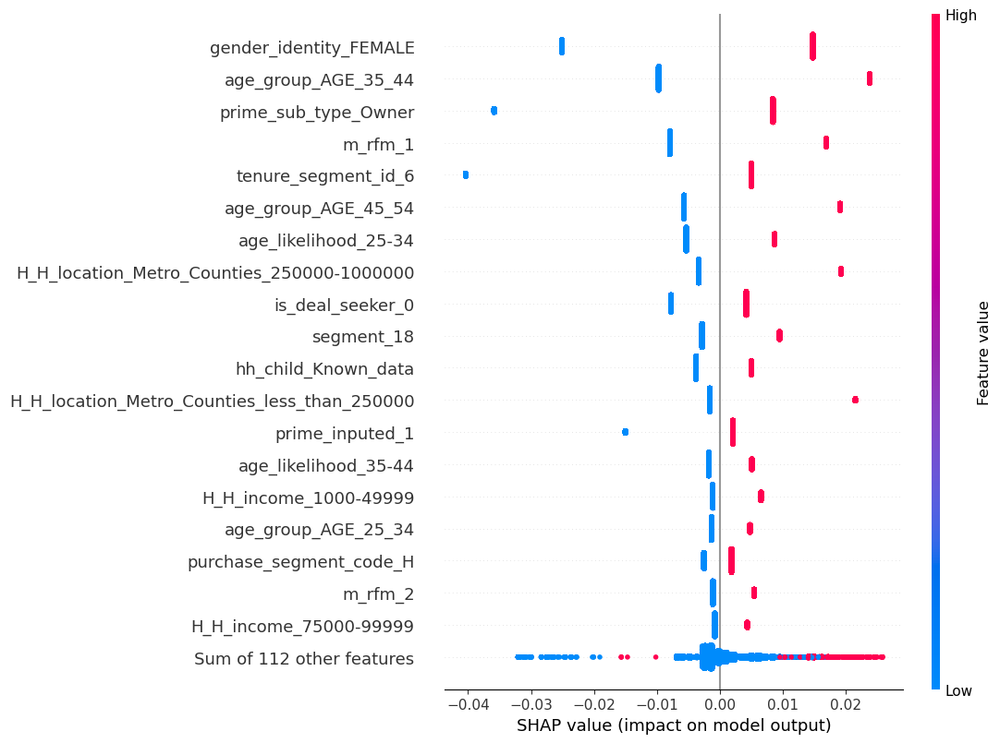

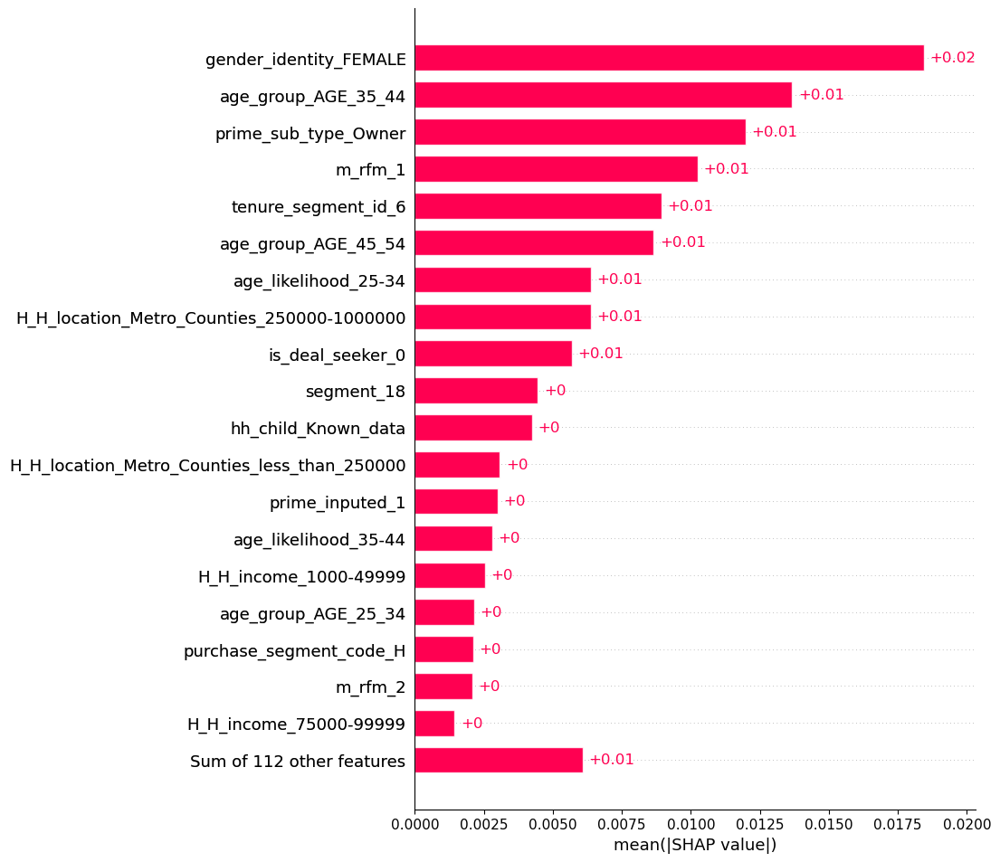


/---- LASSO LARS ----/


R2 Score of test set : -0.702701
Accuracy: 0.587053
Precision: 0.590073
Recall: 0.969125
F1 score: 0.733524


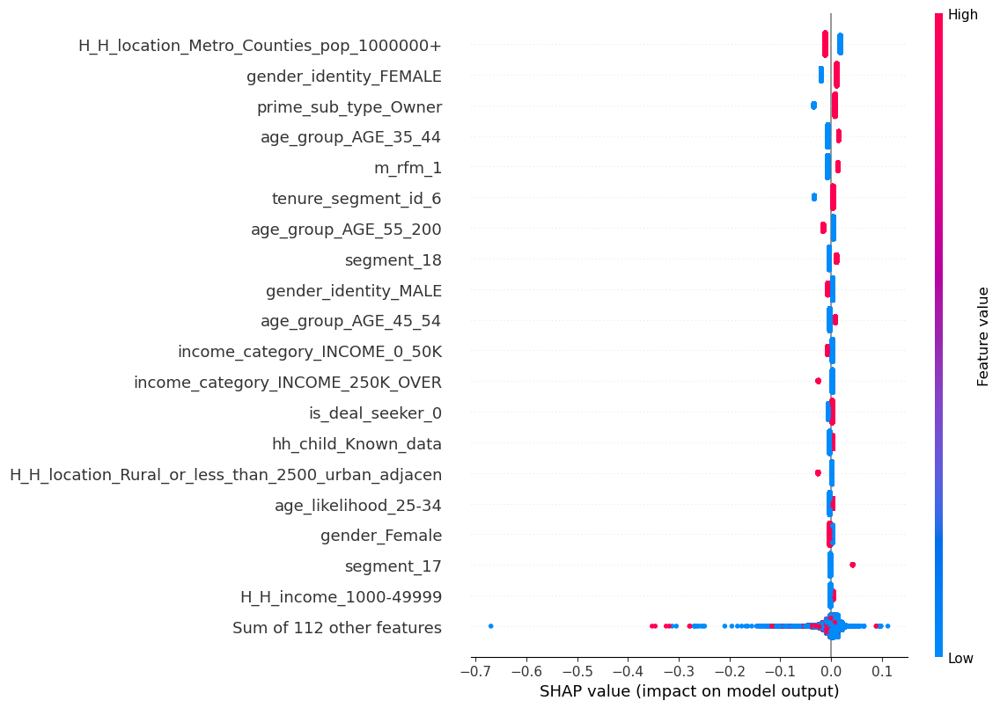

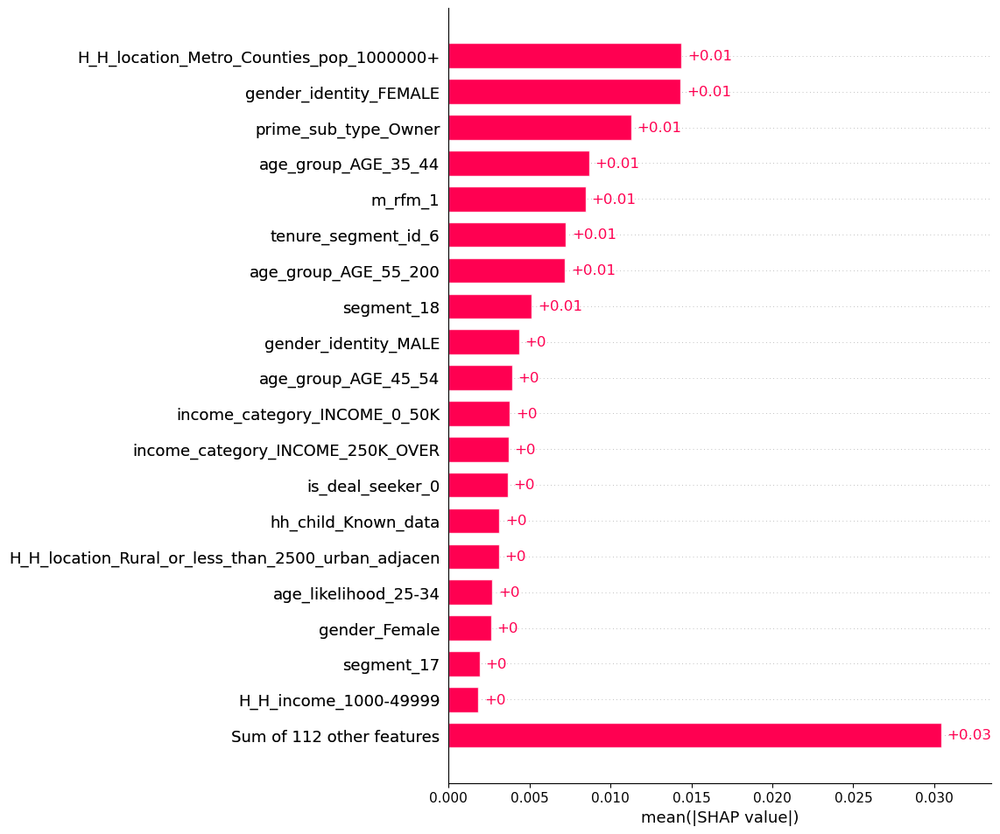


/---- Logistic Regression RFE ----/
Fitting estimator with 131 features.
Fitting estimator with 121 features.
Fitting estimator with 111 features.
Fitting estimator with 101 features.
Fitting estimator with 91 features.
Fitting estimator with 81 features.
Fitting estimator with 71 features.
Fitting estimator with 61 features.
Fitting estimator with 51 features.
Fitting estimator with 41 features.
Fitting estimator with 31 features.
Fitting estimator with 21 features.
20 selected features


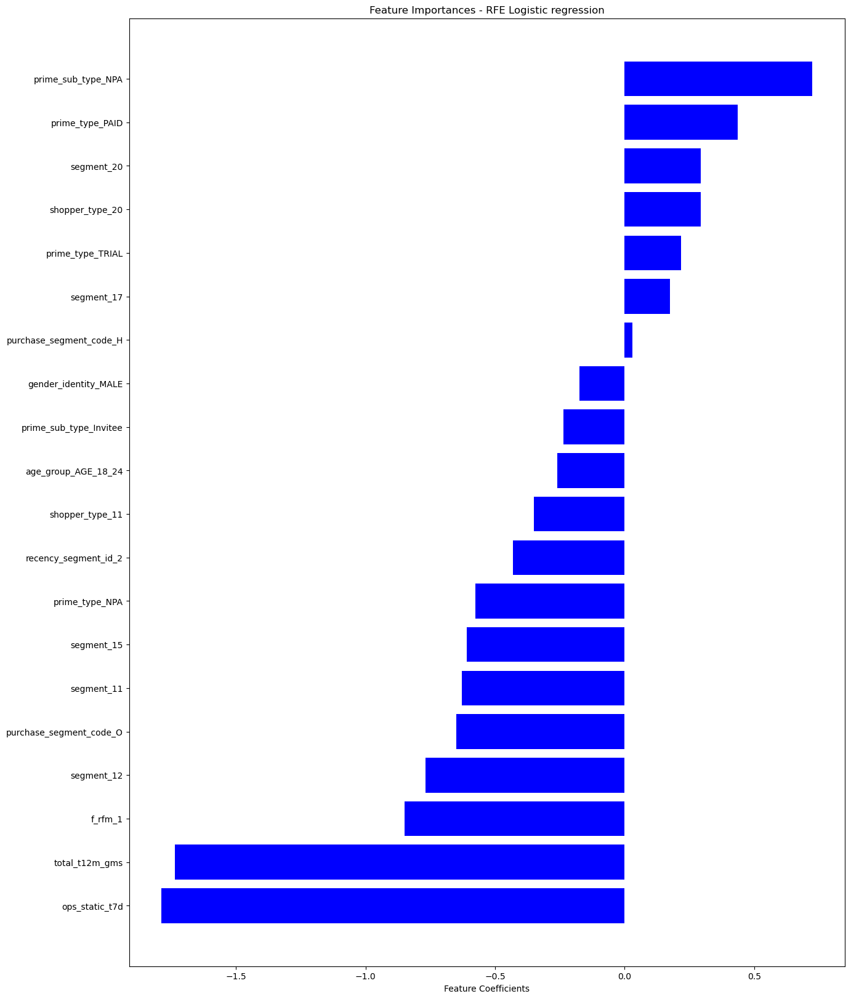

R2 Score of test set : -0.708588
Accuracy: 0.585626
Precision: 0.589084
Recall: 0.970194
F1 score: 0.733064

/---- XGBoost ----/
[0]	test-logloss:0.67805
[100]	test-logloss:0.67419
[200]	test-logloss:0.67293
[300]	test-logloss:0.67235
[400]	test-logloss:0.67198
[500]	test-logloss:0.67173
[584]	test-logloss:0.67161


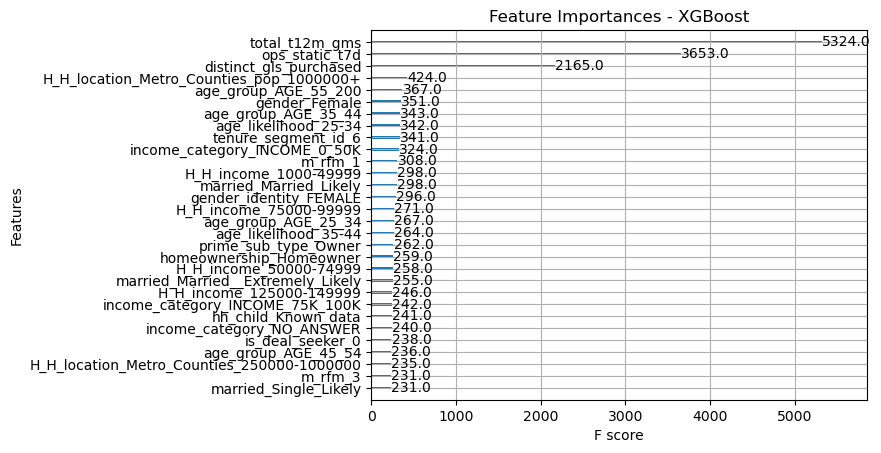

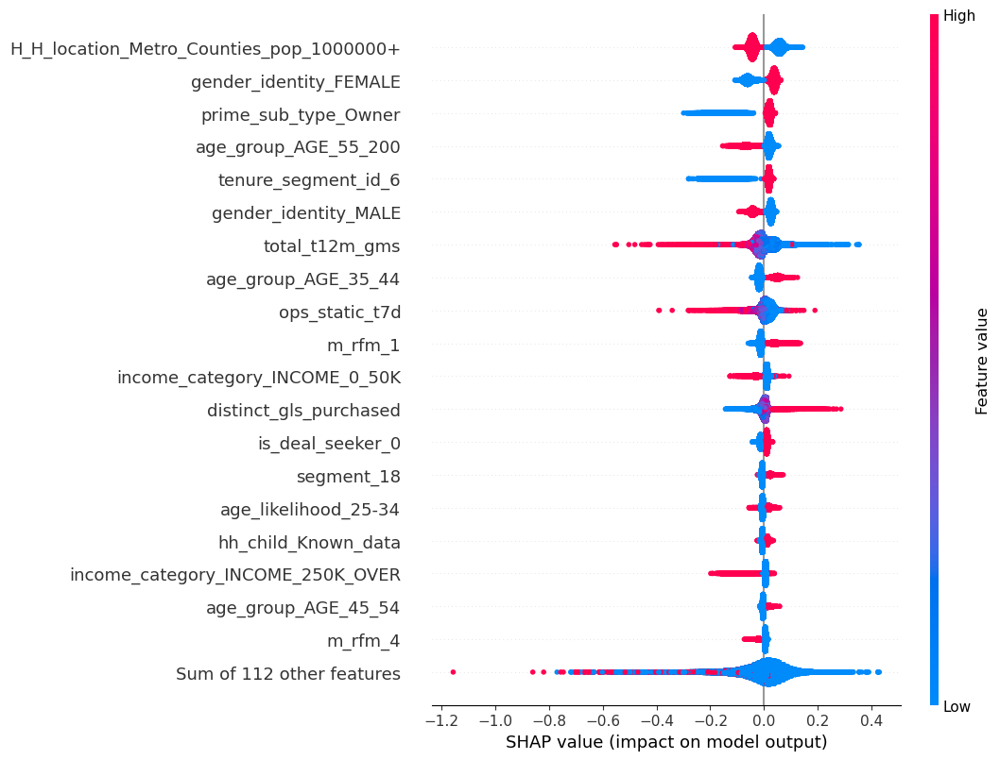

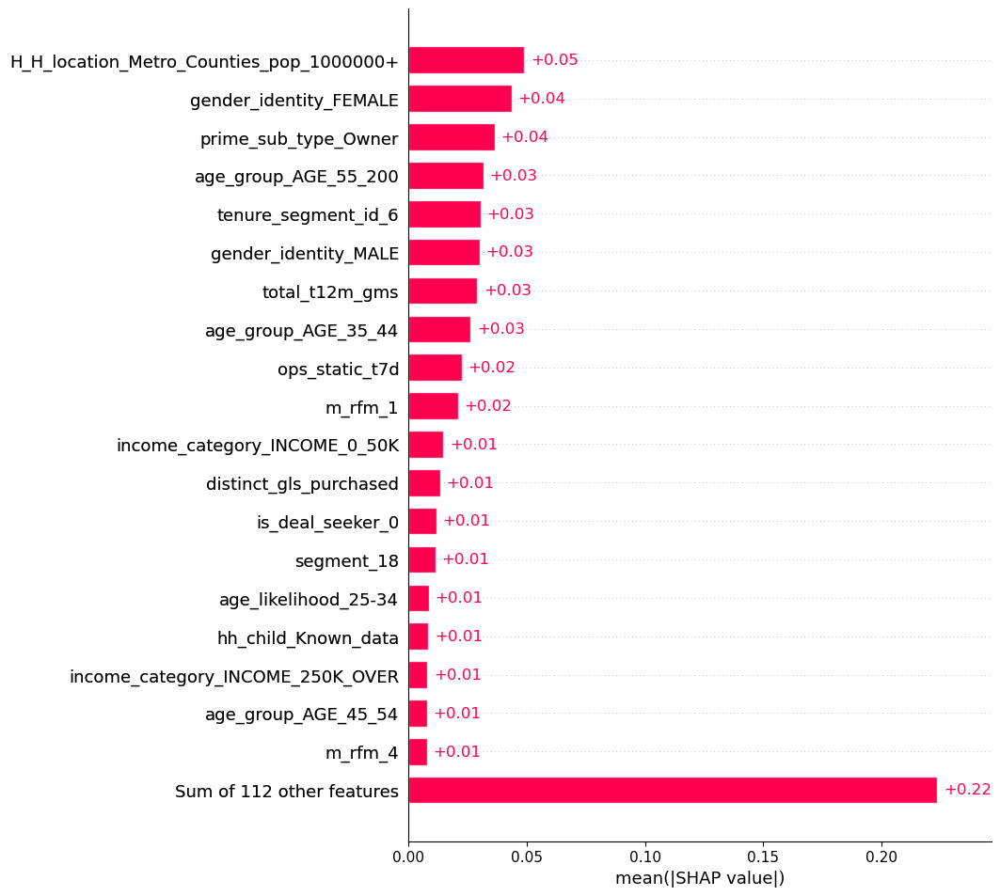

R2 Score of test set : -0.684179
Accuracy: 0.591545
Precision: 0.594276
Recall: 0.956656
F1 score: 0.733130


,model,R2,Accuracy,Precision,Recall,F1
0,LASSO,-0.704424,0.586636,0.589635,0.970787,0.733661
1,LASSO LARS,-0.702701,0.587053,0.590073,0.969125,0.733524
2,RFE - Logistic Regression,-0.708588,0.585626,0.589084,0.970194,0.733064
3,XGBoost,-0.684179,0.591545,0.594276,0.956656,0.733130


In [158]:
# 122 ADSP response data without Benchmark Category - Test
eva_metrics3 = feature_selection_model(df_new, "has_qualified_answer", "Test", 20)
eva_metrics3


/----- EDA -----/
Raw data shape (268526, 49)
Test data shape (143590, 49)
Control data shape (122683, 49)
Total number of X variables: 29
Index(['gender_identity', 'income_category', 'age_group', 'gender', 'married',
       'child', 'hh_person', 'hh_child', 'homeownership', 'H_H_location',
       'H_H_income', 'prime_inputed', 'age_likelihood',
       'distinct_gls_purchased', 'is_fresh_member', 'is_pantry_member',
       'is_deal_seeker', 'purchase_segment_code', 'recency_segment_id',
       'tenure_segment_id', 'r_rfm', 'f_rfm', 'm_rfm', 'total_t12m_gms',
       'prime_sub_type', 'prime_type', 'shopper_type', 'segment',
       'ops_static_t7d'],
      dtype='object')
Total number of y variables:
1    65894
0    56789
Name: has_qualified_answer, dtype: int64

/----- Missing values -----/
X missing values:
gender_identity            0.000000
income_category            0.000000
age_group                  0.000000
gender                    20.856190
married                   42.970094


Weight?,Feature
+0.155,shopper_type_12
+0.098,r_rfm_1
+0.088,segment_17
+0.078,distinct_gls_purchased
+0.076,tenure_segment_id_6
+0.075,shopper_type_20
+0.073,age_group_AGE_45_54
+0.065,H_H_location_Rural_or_less_than_2500_urban_not_adjacent
+0.061,age_group_AGE_55_200
+0.056,age_group_AGE_35_44


R2 Score of test set : -0.765897
Accuracy: 0.560990
Precision: 0.565411
Recall: 0.790975
F1 score: 0.659437


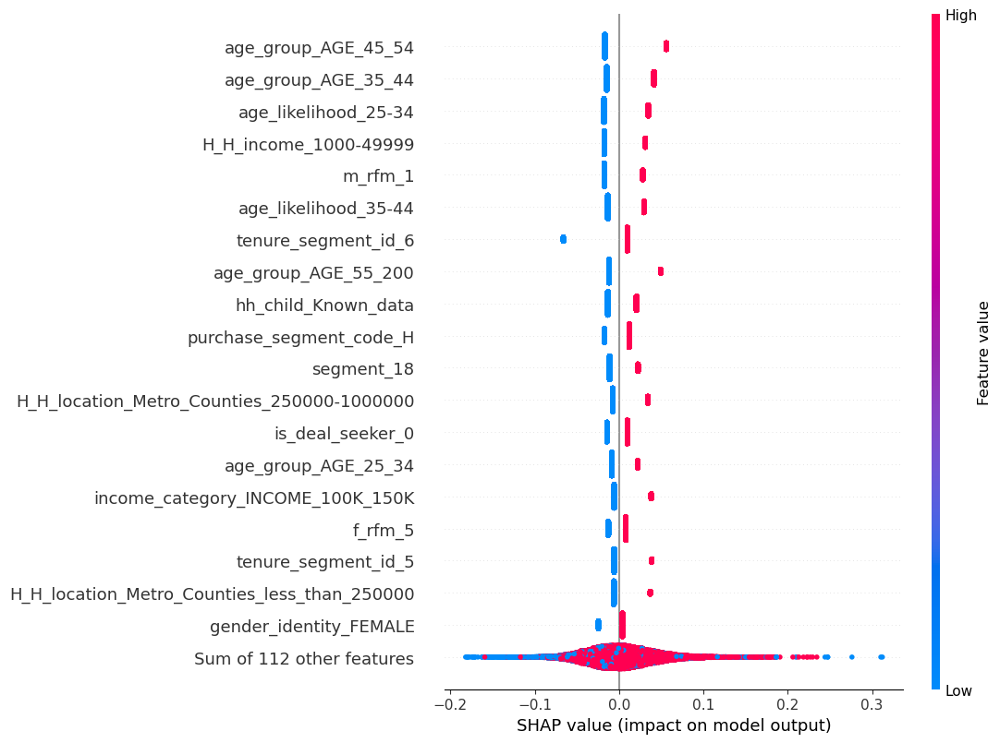

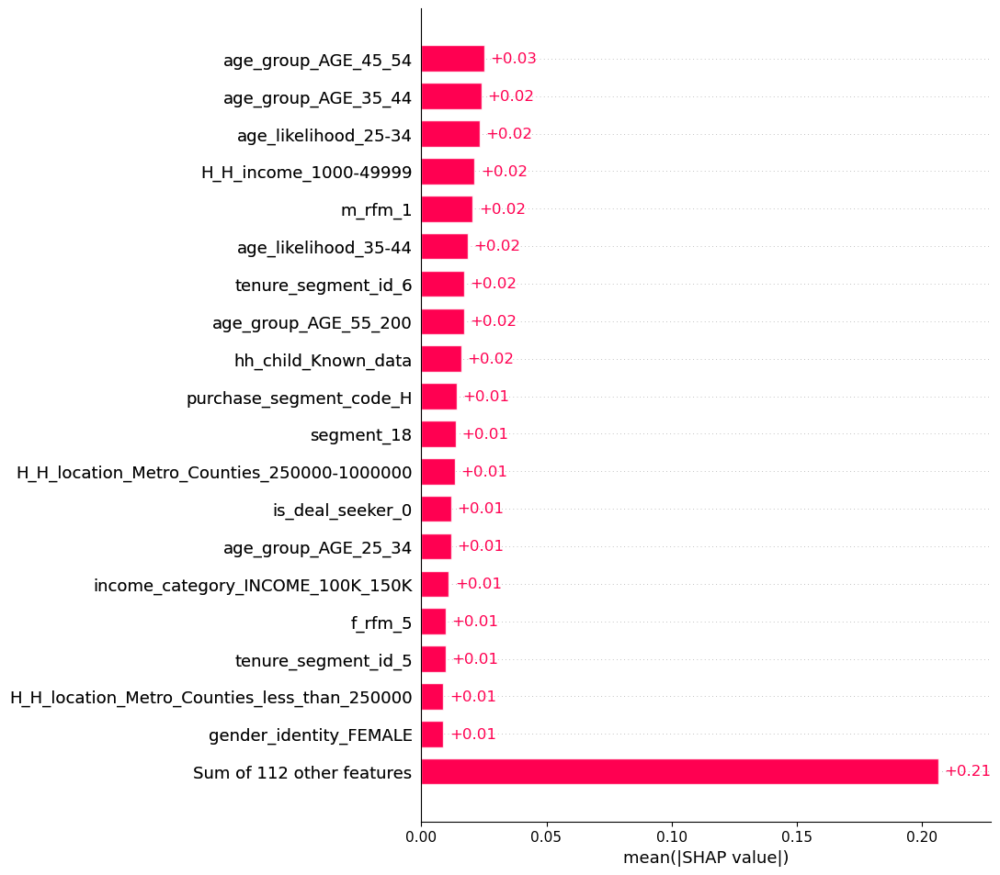


/---- LASSO LARS ----/


R2 Score of test set : -0.766061
Accuracy: 0.560949
Precision: 0.562937
Recall: 0.818127
F1 score: 0.666955


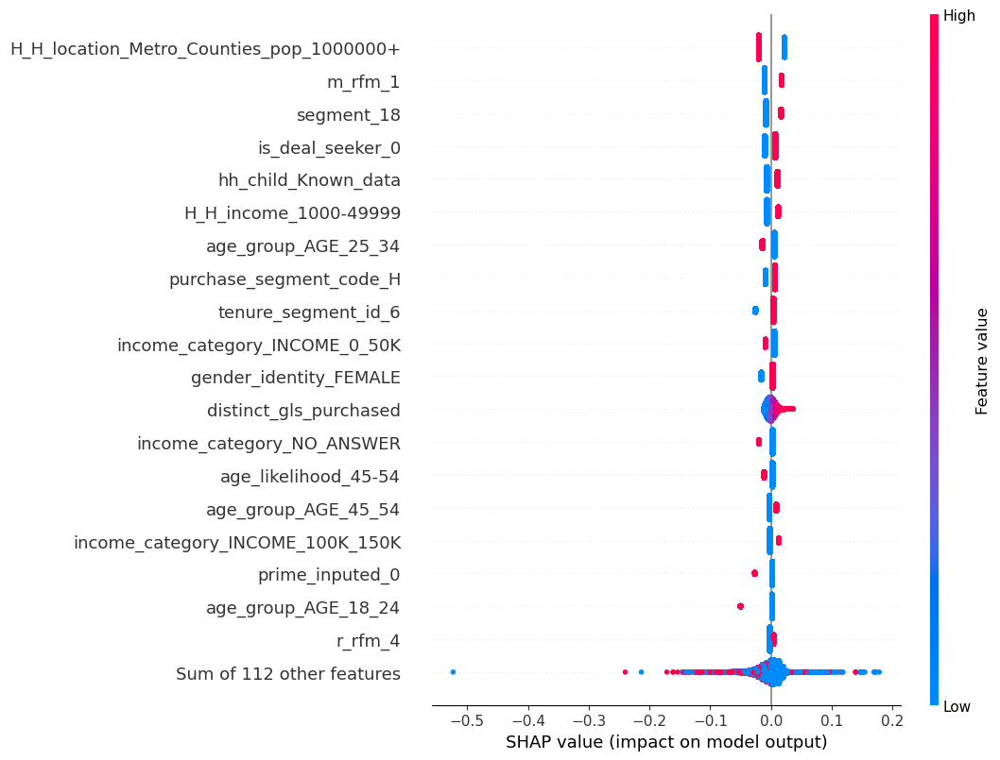

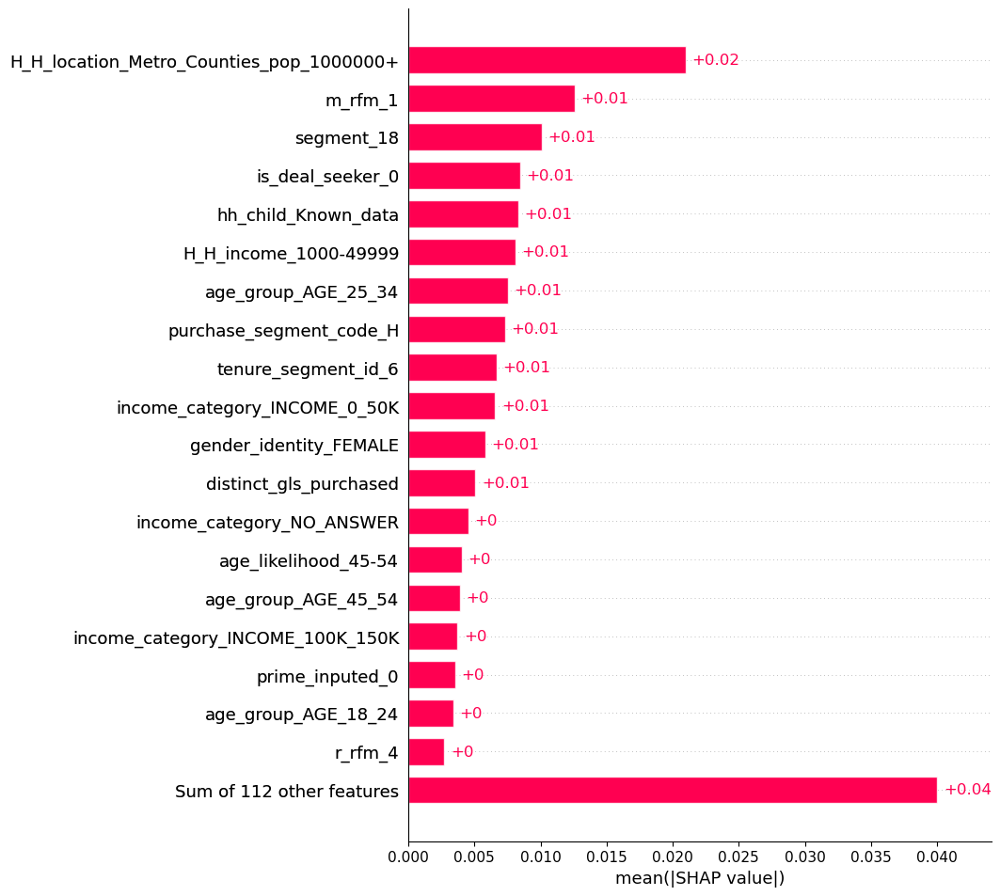


/---- Logistic Regression RFE ----/
Fitting estimator with 131 features.
Fitting estimator with 121 features.
Fitting estimator with 111 features.
Fitting estimator with 101 features.
Fitting estimator with 91 features.
Fitting estimator with 81 features.
Fitting estimator with 71 features.
Fitting estimator with 61 features.
Fitting estimator with 51 features.
Fitting estimator with 41 features.
Fitting estimator with 31 features.
Fitting estimator with 21 features.
20 selected features


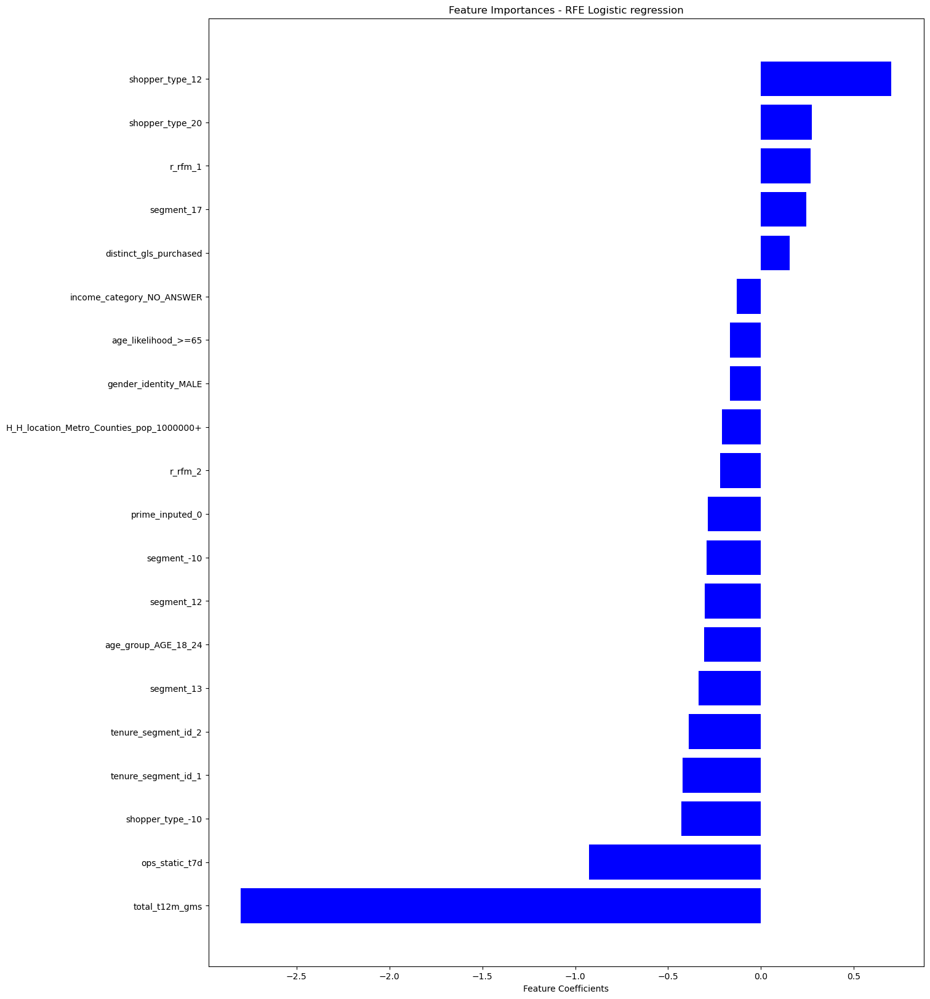

R2 Score of test set : -0.791470
Accuracy: 0.554632
Precision: 0.557810
Recall: 0.825863
F1 score: 0.665872

/---- XGBoost ----/
[0]	test-logloss:0.69026
[100]	test-logloss:0.68526
[200]	test-logloss:0.68364
[300]	test-logloss:0.68288
[400]	test-logloss:0.68251
[500]	test-logloss:0.68232
[524]	test-logloss:0.68233


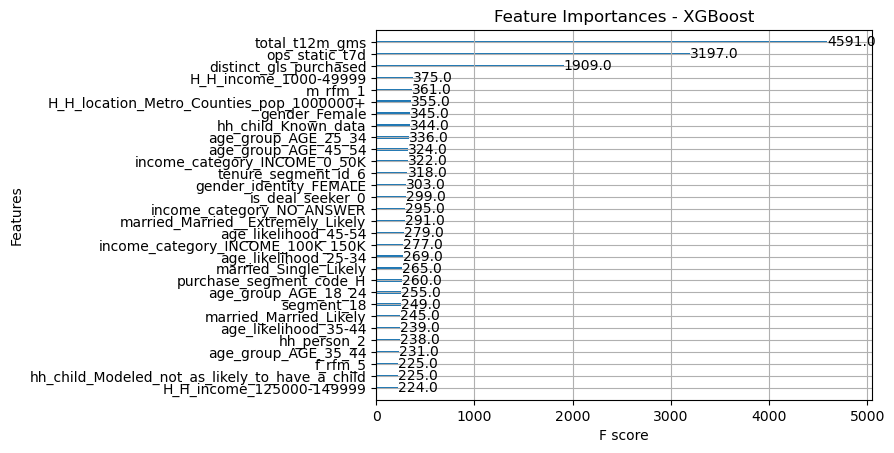

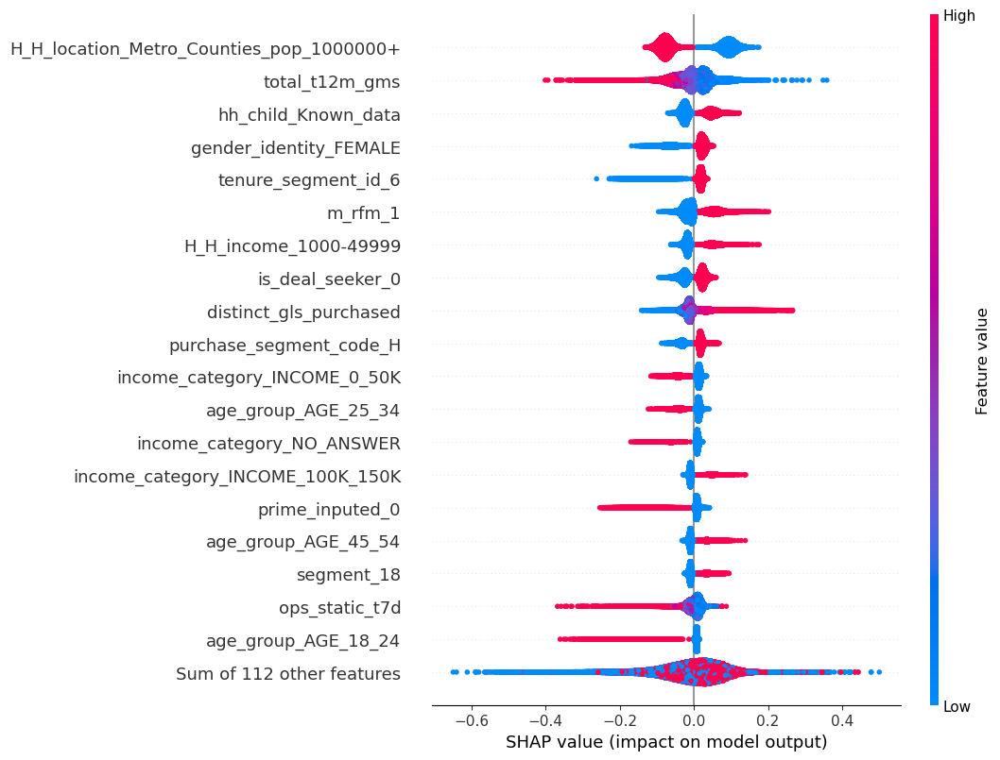

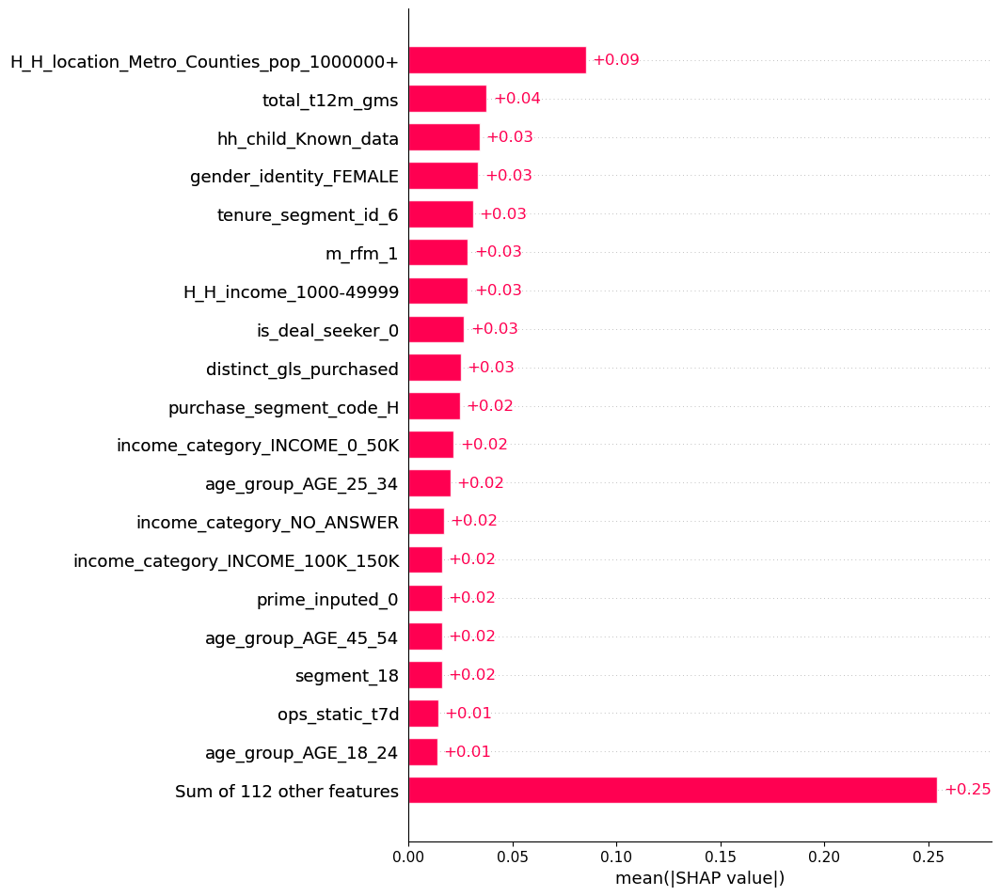

R2 Score of test set : -0.776552
Accuracy: 0.558340
Precision: 0.561731
Recall: 0.810239
F1 score: 0.663479


,model,R2,Accuracy,Precision,Recall,F1
0,LASSO,-0.765897,0.560990,0.565411,0.790975,0.659437
1,LASSO LARS,-0.766061,0.560949,0.562937,0.818127,0.666955
2,RFE - Logistic Regression,-0.791470,0.554632,0.557810,0.825863,0.665872
3,XGBoost,-0.776552,0.558340,0.561731,0.810239,0.663479


In [165]:
# 122 ADSP response data without Benchmark Category - Control
eva_metrics4 = feature_selection_model(df_new, "has_qualified_answer", "Control", 20)
eva_metrics4


/----- EDA -----/
Raw data shape (47221061, 46)
Test data shape (1804157, 46)
Control data shape (45416904, 46)
Total number of X variables: 29
Index(['gender_identity', 'income_category', 'age_group', 'gender', 'married',
       'child', 'hh_person', 'hh_child', 'homeownership', 'H_H_location',
       'H_H_income', 'prime_inputed', 'age_likelihood',
       'distinct_gls_purchased', 'is_fresh_member', 'is_pantry_member',
       'is_deal_seeker', 'purchase_segment_code', 'recency_segment_id',
       'tenure_segment_id', 'r_rfm', 'f_rfm', 'm_rfm', 'total_t12m_gms',
       'prime_sub_type', 'prime_type', 'shopper_type', 'segment',
       'ops_static_t7d'],
      dtype='object')
Total number of y variables:
0    45416904
1     1804157
Name: label, dtype: int64

/----- Missing values -----/
X missing values:
gender_identity            0.000000
income_category            0.000000
age_group                  0.000000
gender                    37.352098
married                   55.102459
chil

Weight?,Feature
+0.024,distinct_gls_purchased
+0.012,r_rfm_5
+0.007,is_deal_seeker_1
+0.007,r_rfm_4
+0.006,f_rfm_5
+0.005,prime_sub_type_Owner
+0.004,H_H_location_Metro_Counties_less_than_250000
+0.004,segment_18
+0.004,H_H_location_Metro_Counties_pop_1000000+
+0.004,age_group_AGE_45_54


R2 Score of test set : -0.039829
Accuracy: 0.961697
Precision: 0.000000
Recall: 0.000000
F1 score: 0.000000

/---- LASSO LARS ----/


Weight?,Feature
+0.267,ops_static_t7d
+0.028,distinct_gls_purchased
+0.019,<BIAS>
+0.006,recency_segment_id_0
+0.005,prime_sub_type_Owner
+0.005,prime_inputed_1
+0.003,r_rfm_5
+0.003,shopper_type_11
+0.002,m_rfm_1
+0.001,f_rfm_5


R2 Score of test set : -0.039829
Accuracy: 0.961697
Precision: 0.000000
Recall: 0.000000
Fitting estimator with 129 features.
Fitting estimator with 119 features.
Fitting estimator with 109 features.
Fitting estimator with 99 features.
Fitting estimator with 89 features.
Fitting estimator with 79 features.
Fitting estimator with 69 features.
Fitting estimator with 59 features.
Fitting estimator with 49 features.
Fitting estimator with 39 features.
30 selected features


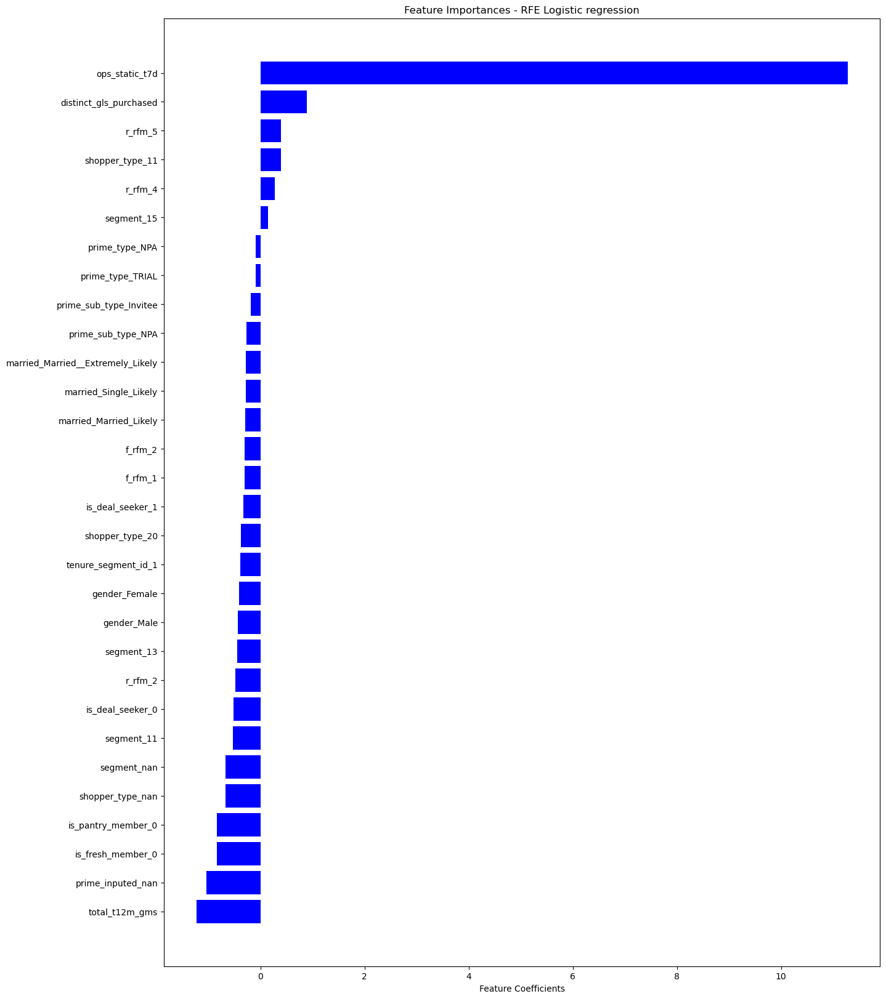

R2 Score of test set : -0.039877
Accuracy: 0.961695
Precision: 0.185185
Recall: 0.000014
F1 score: 0.000028

/---- XGBoost ----/
[0]	test-logloss:0.16246
[100]	test-logloss:0.15969
[200]	test-logloss:0.15903
[300]	test-logloss:0.15883
[500]	test-logloss:0.15870
[600]	test-logloss:0.15867
[700]	test-logloss:0.15864
[800]	test-logloss:0.15862
[900]	test-logloss:0.15860
[999]	test-logloss:0.15858


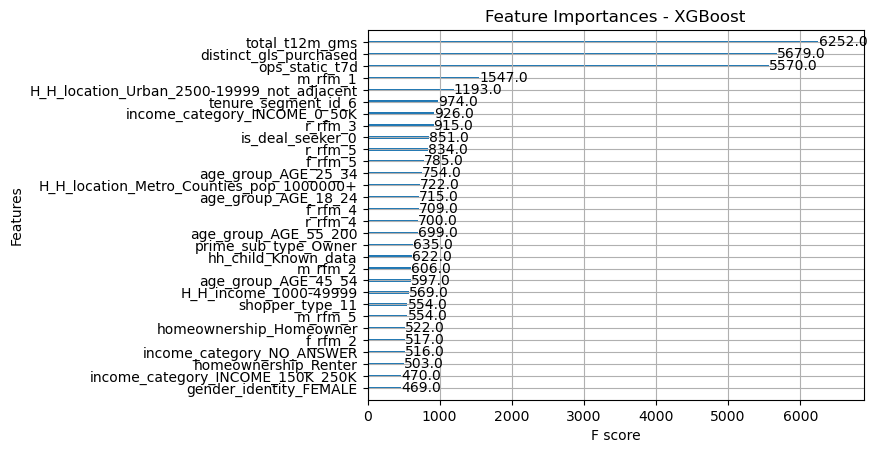

R2 Score of test set : -0.039829
Accuracy: 0.961697
Precision: 0.000000
Recall: 0.000000
F1 score: 0.000000


,model,R2,Accuracy,Precision,Recall,F1
0,LASSO,-0.039829,0.961697,0.000000,0.000000,0.000000
1,LASSO LARS,-0.039829,0.961697,0.000000,0.000000,0.000000
2,RFE - Logistic Regression,-0.039877,0.961695,0.185185,0.000014,0.000028
3,XGBoost,-0.039829,0.961697,0.000000,0.000000,0.000000


In [ ]:
# 122 ADSP model input data
eva_metrics5 = feature_selection_model(df, "label", "All", 30)
eva_metrics5

## Archived - Seperate Model codes

### LASSO

In [44]:
# Hyperparameter tuning - GridSearch
model = Lasso()

search = GridSearchCV(model,
                      {'alpha':np.arange(0.001,0.01,0.001)},
                      cv = 10, scoring="neg_mean_squared_error",verbose=3
                      )  

In [49]:
search.fit(X_train,y_train)

Fitting 10 folds for each of 9 candidates, totalling 90 fits
[CV 1/10] END .....................alpha=0.001;, score=-0.220 total time=   0.9s
[CV 2/10] END .....................alpha=0.001;, score=-0.220 total time=   0.9s
[CV 3/10] END .....................alpha=0.001;, score=-0.223 total time=   0.9s
[CV 4/10] END .....................alpha=0.001;, score=-0.219 total time=   0.9s
[CV 5/10] END .....................alpha=0.001;, score=-0.220 total time=   0.9s
[CV 6/10] END .....................alpha=0.001;, score=-0.222 total time=   0.9s
[CV 7/10] END .....................alpha=0.001;, score=-0.222 total time=   0.9s
[CV 8/10] END .....................alpha=0.001;, score=-0.221 total time=   0.9s
[CV 9/10] END .....................alpha=0.001;, score=-0.220 total time=   0.9s
[CV 10/10] END ....................alpha=0.001;, score=-0.222 total time=   0.9s
[CV 1/10] END .....................alpha=0.002;, score=-0.222 total time=   0.8s
[CV 2/10] END .....................alpha=0.002;,

GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': array([0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009])},
             scoring='neg_mean_squared_error', verbose=3)

In [50]:
# Optimal alpha
search.best_params_['alpha']

0.001

In [33]:
# LASSO
regressor = linear_model.Lasso(alpha = 0.001,
#                                alpha=search.best_params_['alpha'],
                               positive=True,
                               fit_intercept=False, 
                               max_iter=1000,
                               tol=0.0001)
lassomodel = regressor.fit(X_transformed, y)

In [92]:
# Feature importance
display(eli5.show_weights(lassomodel, top=-1, feature_names = col_names))

Weight?,Feature
+0.387,Benchmark_Category_RESTAURANTS
+0.281,Benchmark_Category_CLOTHING_SHOES_AND_JEWELRY
+0.254,Benchmark_Category_AUTOMOTIVE
+0.253,Benchmark_Category_BABY
+0.221,gender_Female
+0.220,gender_Male
+0.186,Benchmark_Category_CELL_PHONES_AND_ACCESSORIES
+0.167,Benchmark_Category_MOVIES_AND_TV
+0.161,Benchmark_Category_BEAUTY_AND_PERSONAL_CARE
+0.128,Benchmark_Category_APPLIANCES


In [71]:
# Feature importance predictor
eli5.explain_prediction(lassomodel, doc = regressor.coef_)

Explanation(estimator='Lasso(alpha=0.001, fit_intercept=False, positive=True)', description=None, error=None, method='linear model', is_regression=True, targets=[TargetExplanation(target='y', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='x194', weight=0.15094833039105368, std=None, value=0.38852069493278435), FeatureWeight(feature='x186', weight=0.08281253957166484, std=None, value=0.2877716795858565), FeatureWeight(feature='x181', weight=0.06762639874730698, std=None, value=0.2600507618664229), FeatureWeight(feature='x182', weight=0.06417301275785729, std=None, value=0.25332392851417984), FeatureWeight(feature='x20', weight=0.04772762511448147, std=None, value=0.21846653087940374), FeatureWeight(feature='x21', weight=0.047367138246343296, std=None, value=0.21763992796898113), FeatureWeight(feature='x185', weight=0.032980615749610684, std=None, value=0.18160566001534942), FeatureWeight(feature='x192', weight=0.028070218288610633, std=None, value=0.16754169119538764), FeatureWeight(feature='x183', weight=0.0265135329361253, std=None, value=0.16282976673853372), FeatureWeight(feature='x178', weight=0.019300125565070027, std=None, value=0.13892489181233875), FeatureWeight(feature='x193', weight=0.012745716222011075, std=None, value=0.11289692742502373), FeatureWeight(feature='x190', weight=0.009196650216397626, std=None, value=0.09589916692233372), FeatureWeight(feature='x195', weight=0.0035228532575960997, std=None, value=0.059353628849431773), FeatureWeight(feature='x196', weight=0.0032315552202498055, std=None, value=0.05684676965536217), FeatureWeight(feature='x101', weight=0.0025484791204507746, std=None, value=0.05048246349427467), FeatureWeight(feature='x3', weight=0.002276263404634204, std=None, value=0.04771020231181381), FeatureWeight(feature='x113', weight=0.0022677417520998062, std=None, value=0.04762081217387841), FeatureWeight(feature='x148', weight=0.0010220884092995654, std=None, value=0.03197011744269272), FeatureWeight(feature='x150', weight=0.0009862761353188736, std=None, value=0.031405033598435675), FeatureWeight(feature='x188', weight=0.0007709514803659582, std=None, value=0.02776601304411489), FeatureWeight(feature='x16', weight=0.000654983523059947, std=None, value=0.02559264587845397), FeatureWeight(feature='x17', weight=0.0005622459189552454, std=None, value=0.023711725347499397), FeatureWeight(feature='x90', weight=0.0004973353745328773, std=None, value=0.02230101734300203), FeatureWeight(feature='x135', weight=0.0004478664818576601, std=None, value=0.021162856183834452), FeatureWeight(feature='x89', weight=0.0004193601494136063, std=None, value=0.020478284825971298), FeatureWeight(feature='x61', weight=0.0002932552323274487, std=None, value=0.017124696561616755), FeatureWeight(feature='x62', weight=0.00023660799797684632, std=None, value=0.015382067415560443), FeatureWeight(feature='x70', weight=0.00018979569138195902, std=None, value=0.013776635706222293), FeatureWeight(feature='x81', weight=0.00010394443519540164, std=None, value=0.010195314374525272), FeatureWeight(feature='x13', weight=8.848234716770489e-05, std=None, value=0.009406505576870982), FeatureWeight(feature='x51', weight=6.093633654406146e-05, std=None, value=0.007806172976821706), FeatureWeight(feature='x84', weight=5.075597298267886e-05, std=None, value=0.007124322633252853), FeatureWeight(feature='x55', weight=5.0683742378335e-05, std=None, value=0.007119251532172115), FeatureWeight(feature='x78', weight=4.2247487434016276e-05, std=None, value=0.006499806722820016), FeatureWeight(feature='x12', weight=3.390915788949953e-05, std=None, value=0.005823157038024952), FeatureWeight(feature='x23', weight=2.8769797051633972e-05, std=None, value=0.005363748414274664), FeatureWeight(feature='x184', weight=2.7711225181644462e-05, std=None, value=0.005264145247012516), FeatureWeight(feature='x137', weight=2.7011969734818083e-05, std=None, value=0.005197304083351106), FeatureWeight(feature='x93', weight=1.628000812479575e-05, std=None

In [53]:
eva_metrics = eva_model(X_transformed,y,lassomodel,"LASSO")
eva_metrics

[0.5740772  0.52140788 0.70008142 ... 0.52695861 0.60285281 0.54576688]
R2 Score of test set : -0.550795
Accuracy: 0.623894
Precision: 0.647047
Recall: 0.789158
F1 score: 0.711072


,model,R2,Accuracy,Precision,Recall,F1
0,LASSO,-0.550795,0.623894,0.647047,0.789158,0.711072


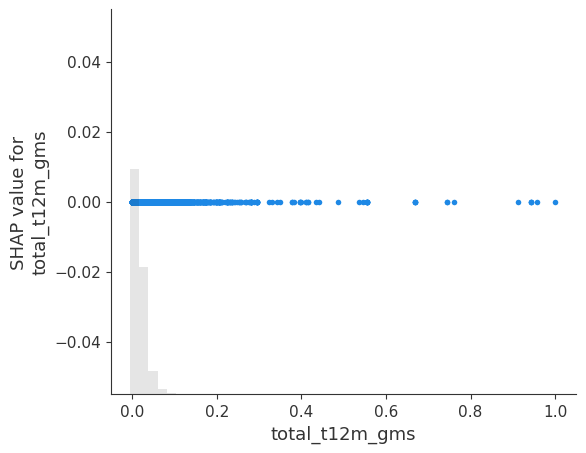

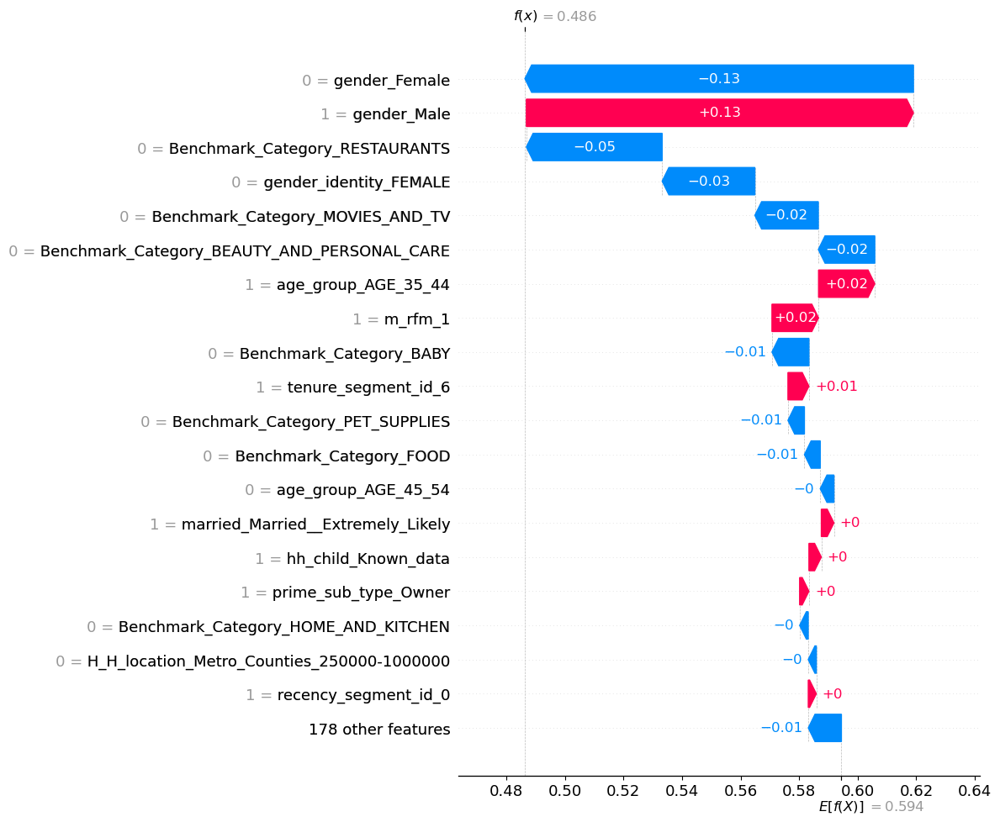

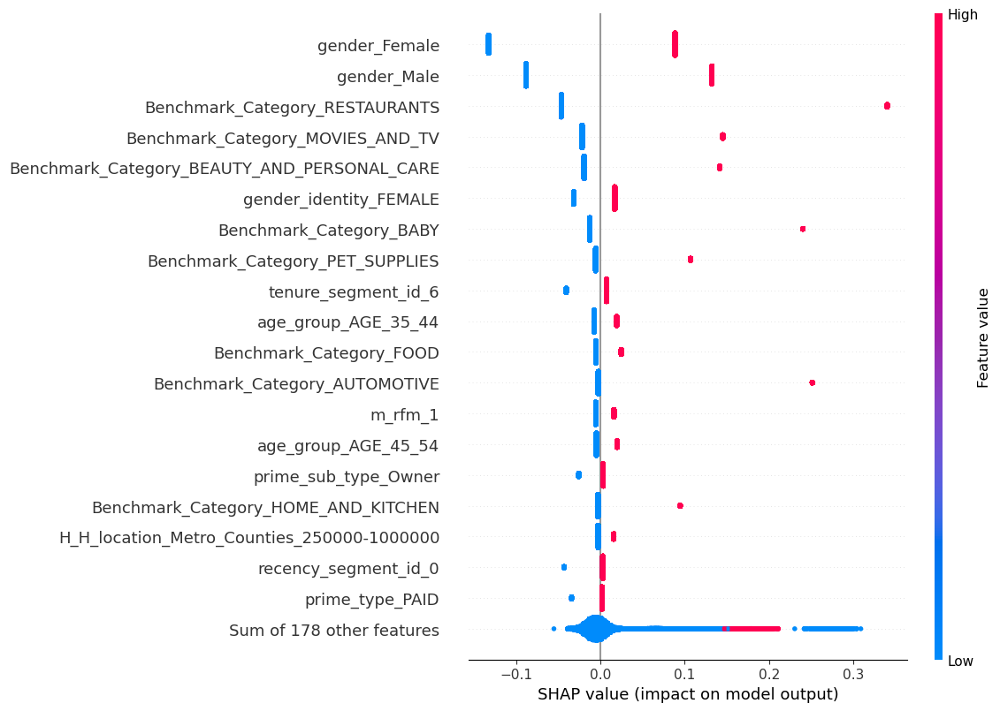

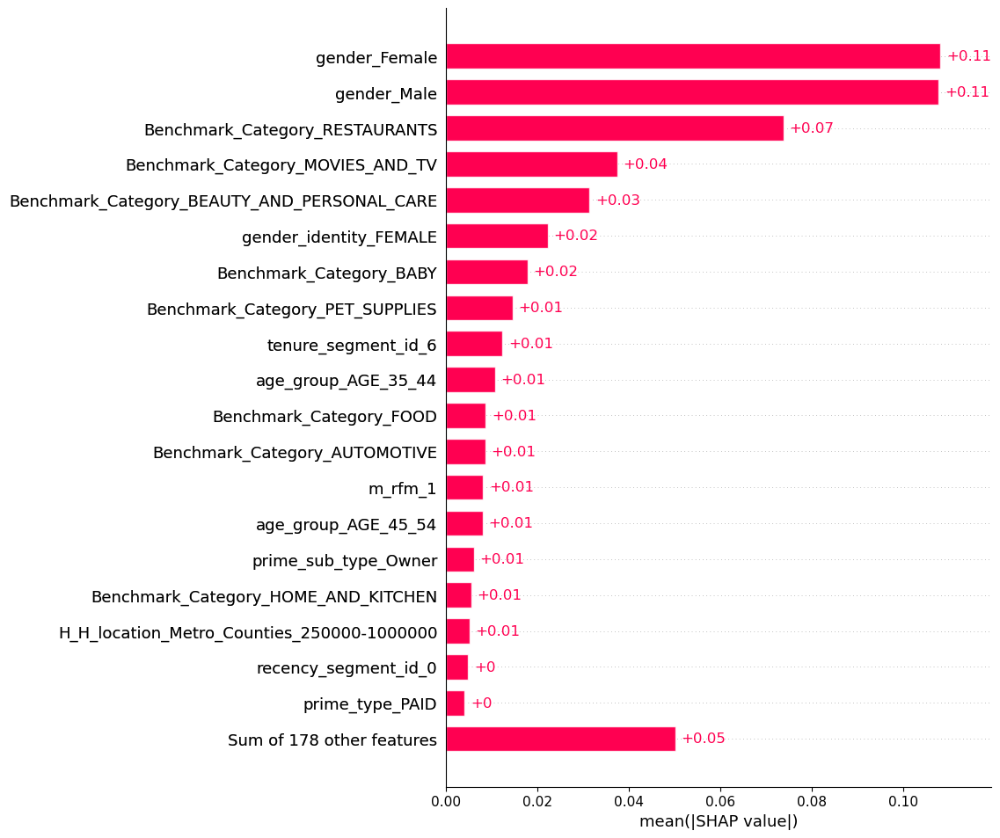

In [57]:
shap_explainer(X_transformed, lassomodel,"Linear", col_names, max_features=20)

#### LASSO LARS

In [58]:
regressor= linear_model.LassoLarsCV(cv= 5)
lassolarsmodel = regressor.fit(X_transformed, y)

In [59]:
# Feature importance
eli5.show_weights(lassolarsmodel, top=-1, feature_names = col_names)

Weight?,Feature
+0.524,<BIAS>
+0.262,Benchmark_Category_RESTAURANTS
+0.258,Benchmark_Category_CLOTHING_SHOES_AND_JEWELRY
+0.191,recency_segment_id_1.0
+0.159,Benchmark_Category_BABY
+0.159,Benchmark_Category_AUTOMOTIVE
+0.132,shopper_type_20
+0.125,tenure_segment_id_2.0
+0.124,Benchmark_Category_CELL_PHONES_AND_ACCESSORIES
+0.104,Benchmark_Category_APPLIANCES


In [60]:
eva_metrics = eva_model(X_transformed,y,lassolarsmodel,"LASSO LARS")
eva_metrics

[0.52795069 0.52542994 0.68023913 ... 0.50260986 0.61730525 0.55752058]
R2 Score of test set : -0.510593
Accuracy: 0.633644
Precision: 0.659936
Recall: 0.774314
F1 score: 0.712565


,model,R2,Accuracy,Precision,Recall,F1
0,LASSO LARS,-0.510593,0.633644,0.659936,0.774314,0.712565


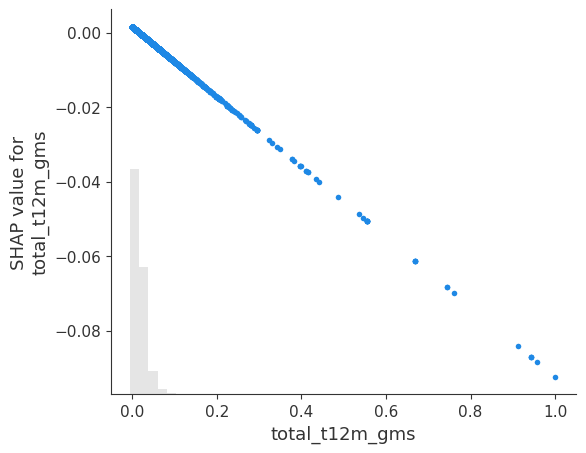

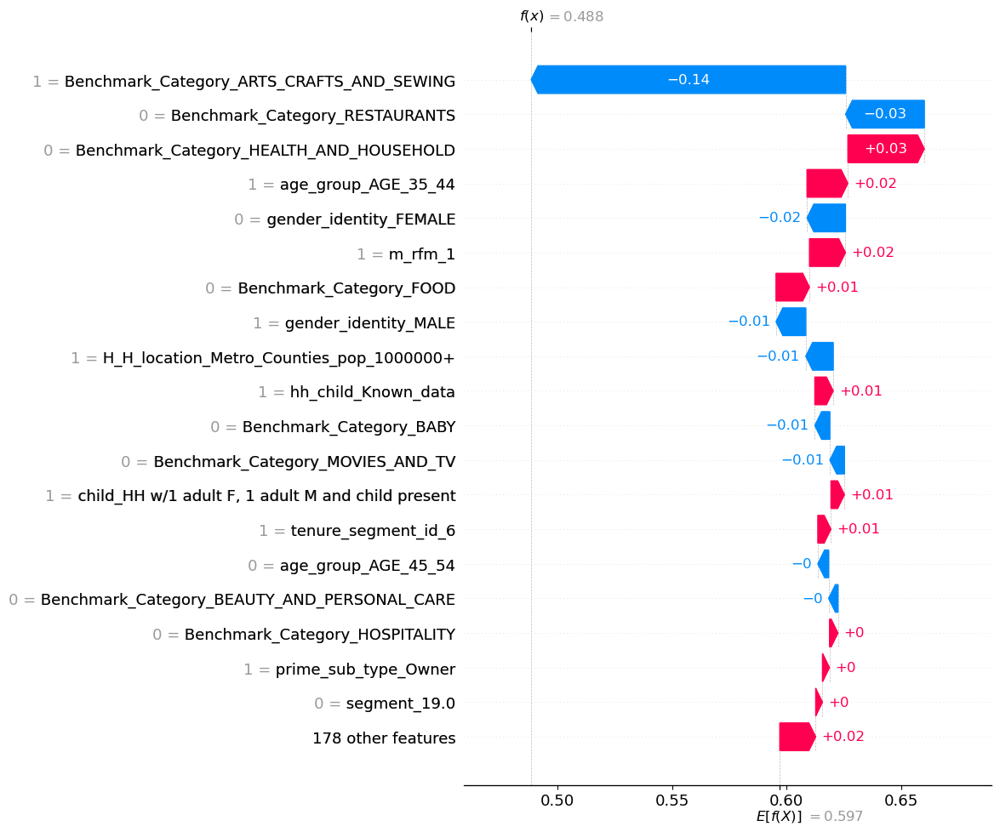

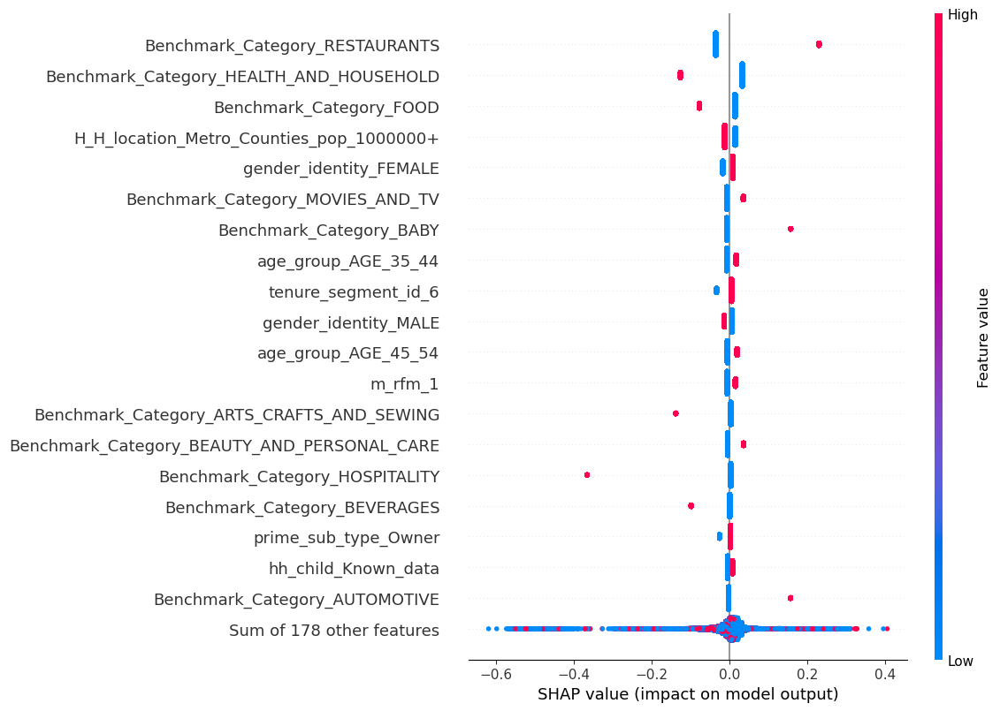

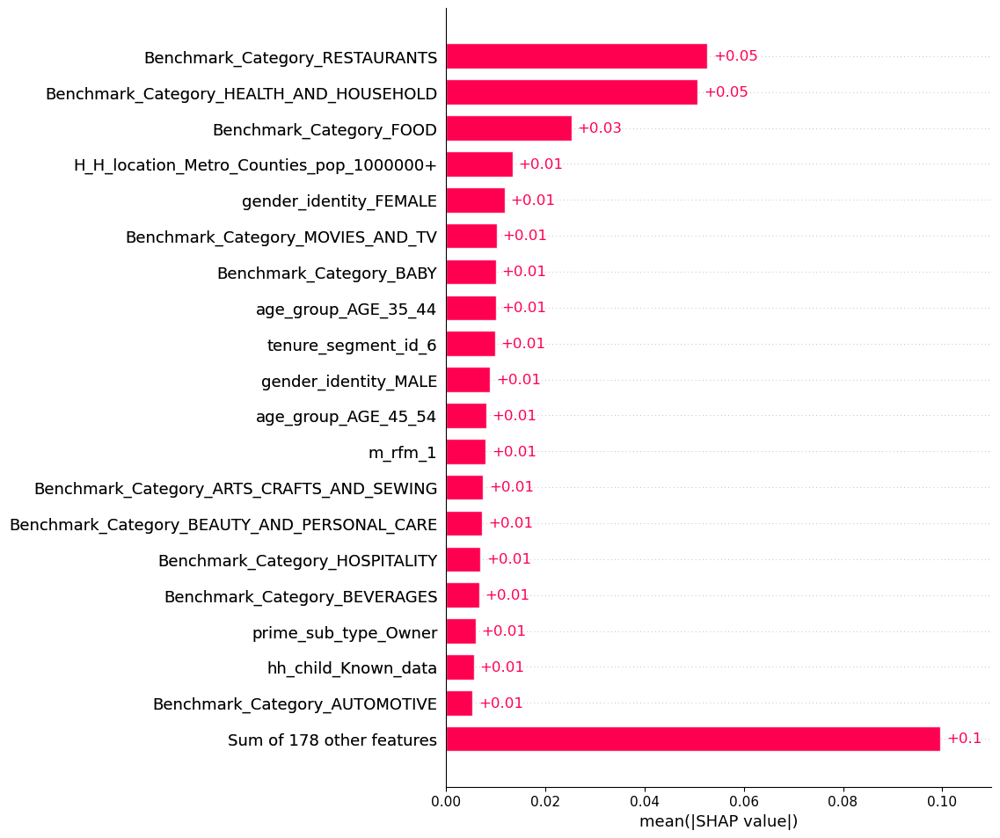

In [246]:
shap_explainer(X_transformed, model, col_names, max_features=20)

### RFE - Logistic Regression

In [96]:
num_feats = 20
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)

# logistic regression
rfe_selector = RFE(estimator=LogisticRegression(max_iter=1000), n_features_to_select=num_feats, step=10, verbose=5)
rfe_selector.fit(X_transformed, y)
rfemodel = LogisticRegression(max_iter=1000)
pipeline = Pipeline(steps=[('s',rfe_selector),('m',rfemodel)])
rfe_support = rfe_selector.get_support()
rfe_feature = [x for x, y in zip(col_names, rfe_support.tolist()) if y == True]
print(str(len(rfe_feature)), 'selected features')

Fitting estimator with 197 features.
Fitting estimator with 187 features.
Fitting estimator with 177 features.
Fitting estimator with 167 features.
Fitting estimator with 157 features.
Fitting estimator with 147 features.
Fitting estimator with 137 features.
Fitting estimator with 127 features.
Fitting estimator with 117 features.
Fitting estimator with 107 features.
Fitting estimator with 97 features.
Fitting estimator with 87 features.
Fitting estimator with 77 features.
Fitting estimator with 67 features.
Fitting estimator with 57 features.
Fitting estimator with 47 features.
Fitting estimator with 37 features.
Fitting estimator with 27 features.
20 selected features


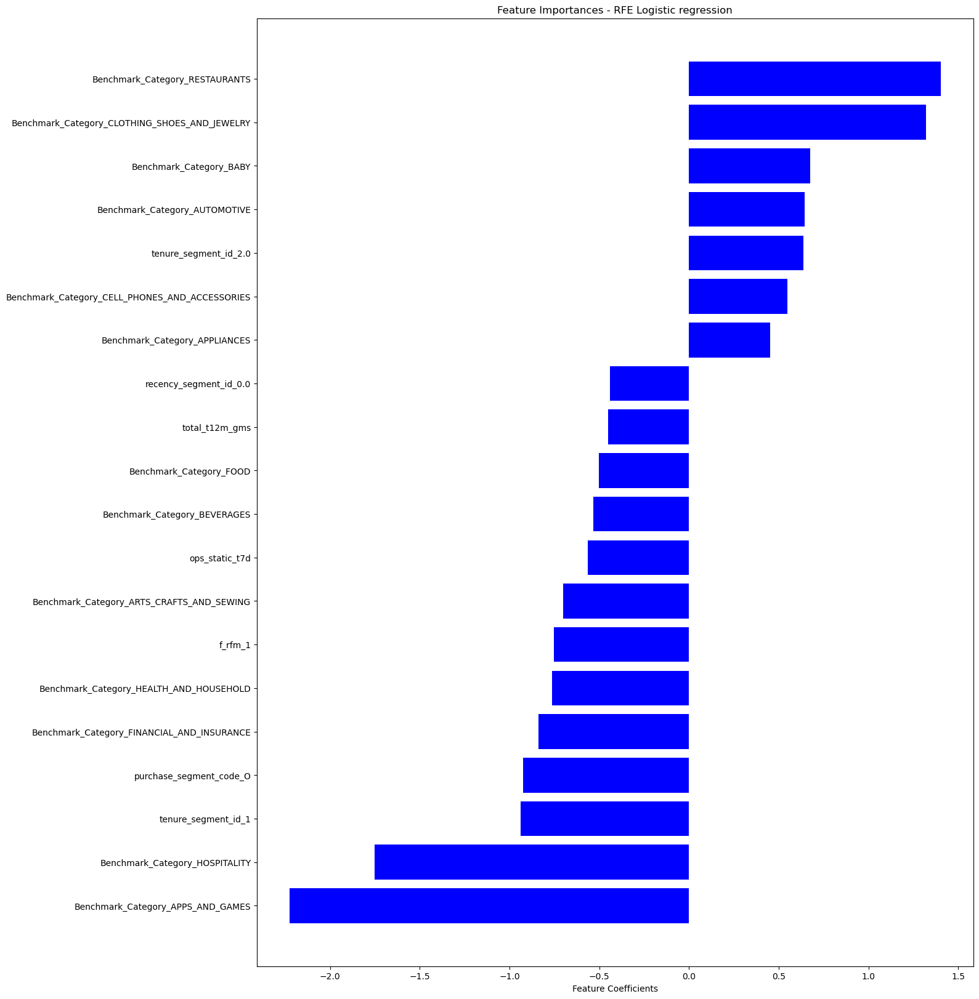

In [249]:
most_important_names = [rfe_feature[i] for i in range(num_feats)]
zipped_feats = zip(most_important_names,rfe_selector.estimator_.coef_[0])
zipped_feats = sorted(zipped_feats, key=lambda x: x[1], reverse=False)
features, importances = zip(*zipped_feats)
top_features = features[:num_feats]
top_importances = importances[:num_feats]


fig, ax = plt.subplots(figsize=(15,20))
plt.title('Feature Importances - RFE Logistic regression')
plt.barh(range(len(top_importances)), top_importances, color='b', align='center')
plt.yticks(range(len(top_importances)), top_features)
plt.xlabel('Feature Coefficients')
plt.show()

# plt.savefig('s3://fortunax/survey_analysis/feature_selection/rfe_log.png')

In [108]:
rfe_selector = RFE(estimator=LogisticRegression(max_iter=1000), n_features_to_select=num_feats, step=10, verbose=5)
rfemodel = rfe_selector.fit(X_transformed, y)
# pipeline = Pipeline(steps=[('s',rfe_selector),('m',rfemodel)])
eva_metrics = eva_model(X_transformed,y,rfemodel ,"RFE - Logistic Reg", kfold=10)
eva_metrics

Fitting estimator with 197 features.
Fitting estimator with 187 features.
Fitting estimator with 177 features.
Fitting estimator with 167 features.
Fitting estimator with 157 features.
Fitting estimator with 147 features.
Fitting estimator with 137 features.
Fitting estimator with 127 features.
Fitting estimator with 117 features.
Fitting estimator with 107 features.
Fitting estimator with 97 features.
Fitting estimator with 87 features.
Fitting estimator with 77 features.
Fitting estimator with 67 features.
Fitting estimator with 57 features.
Fitting estimator with 47 features.
Fitting estimator with 37 features.
Fitting estimator with 27 features.
[1 1 1 ... 1 1 1]
R2 Score of test set : -0.546057
Accuracy: 0.625044
Precision: 0.642689
Recall: 0.812196
F1 score: 0.717568


,model,R2,Accuracy,Precision,Recall,F1
0,RFE - Logistic Reg,-0.546057,0.625044,0.642689,0.812196,0.717568


In [113]:
shap_explainer(X_transformed, rfemodel , "Linear",col_names, max_features=20)

InvalidModelError: An unknown model type was passed: <class 'sklearn.feature_selection._rfe.RFE'>

### XGBoost

In [19]:
# create a train/test split
d_train = xgboost.DMatrix(X_train, label=y_train, feature_names=col_names, enable_categorical=True)
d_test = xgboost.DMatrix(X_test, label=y_test, feature_names=col_names, enable_categorical=True)

In [66]:
params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y_train.astype(int)),
    "eval_metric": "logloss"
}
xgmodel = xgboost.train(params, d_train, 1000, evals = [(d_test, "test")], verbose_eval=100, early_stopping_rounds=20)

[0]	test-logloss:0.67738
[100]	test-logloss:0.64091
[200]	test-logloss:0.63077
[300]	test-logloss:0.62640
[400]	test-logloss:0.62404
[500]	test-logloss:0.62263
[600]	test-logloss:0.62169
[700]	test-logloss:0.62097
[800]	test-logloss:0.62042
[900]	test-logloss:0.62008
[999]	test-logloss:0.61967


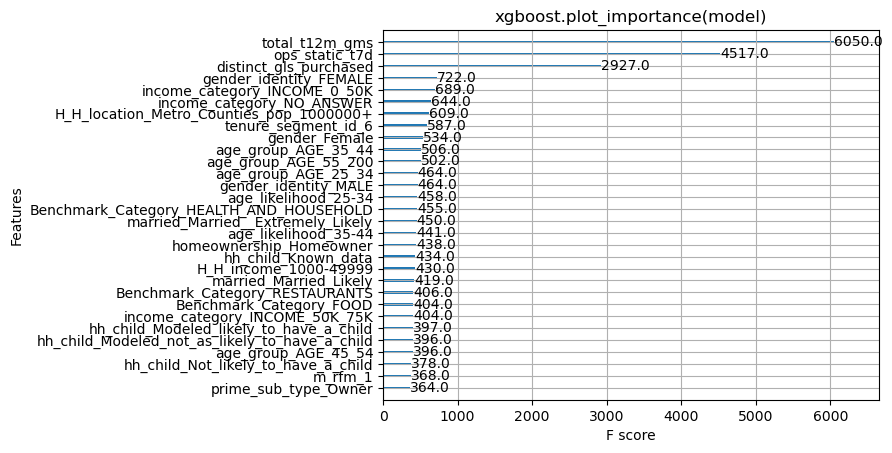

In [67]:
# traditional plot
xgboost.plot_importance(xgmodel,max_num_features=30)

plt.title("xgboost.plot_importance(model)")
plt.show()

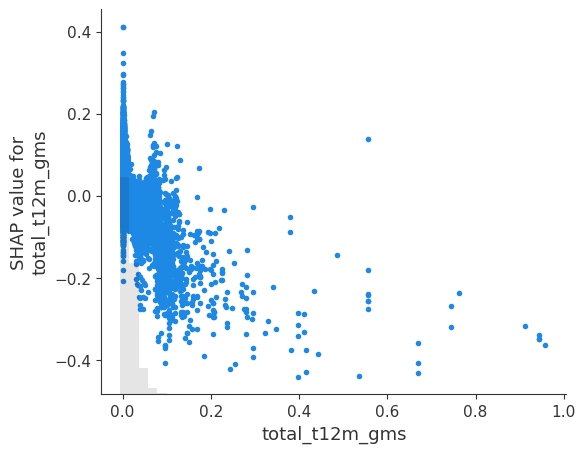

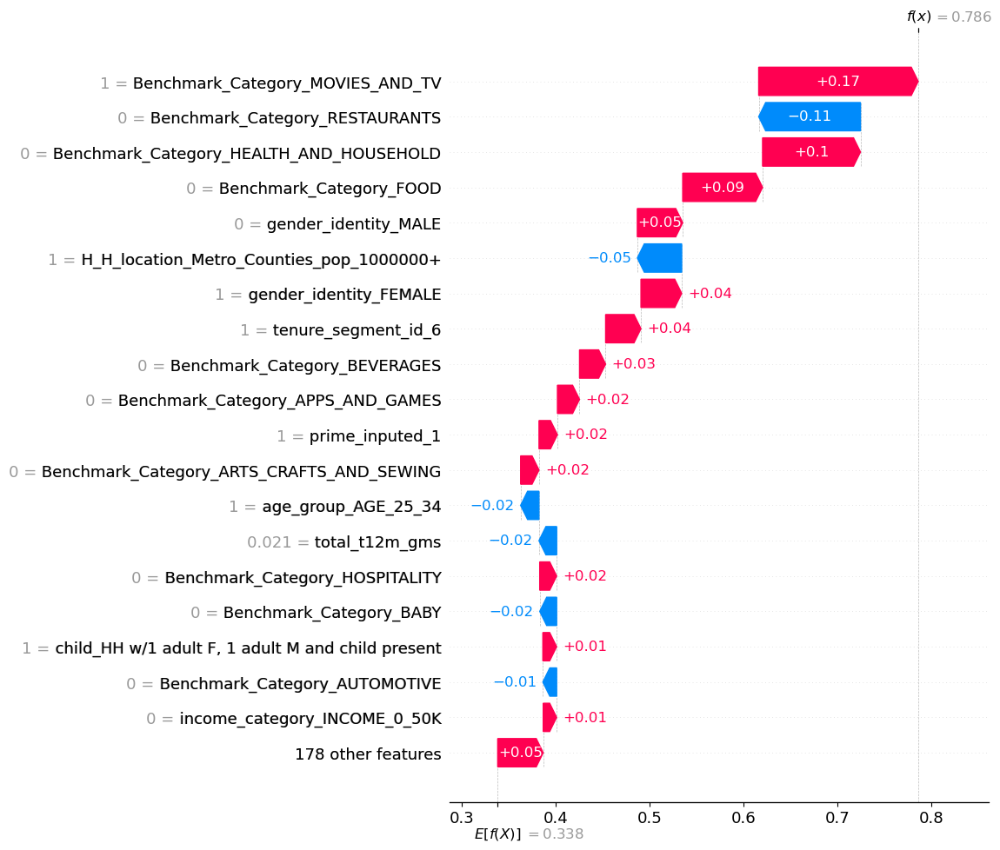

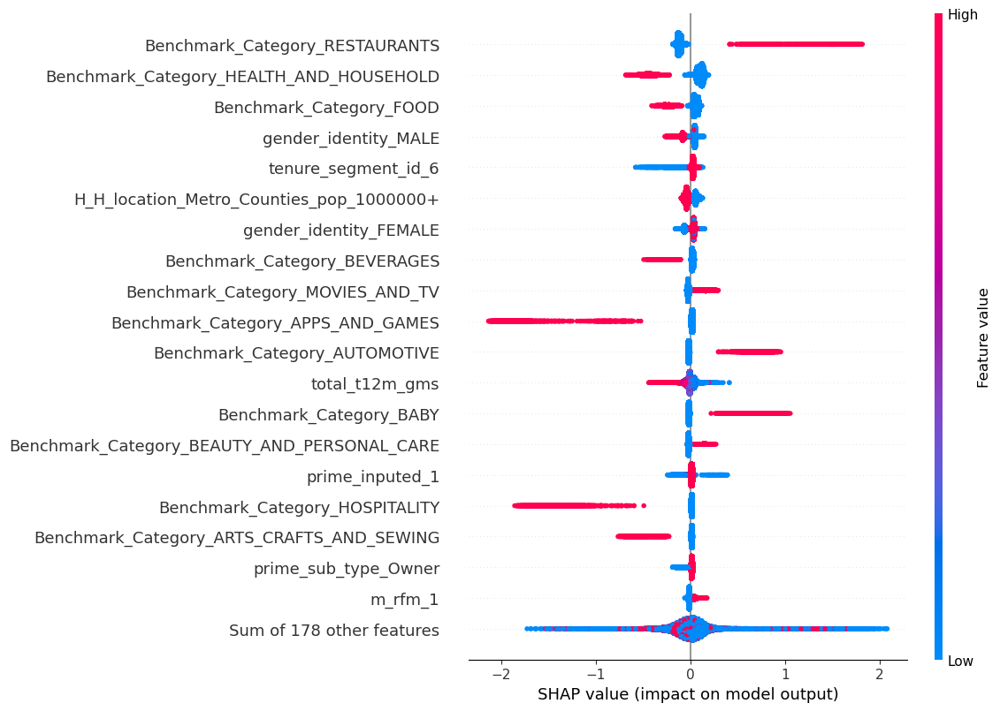

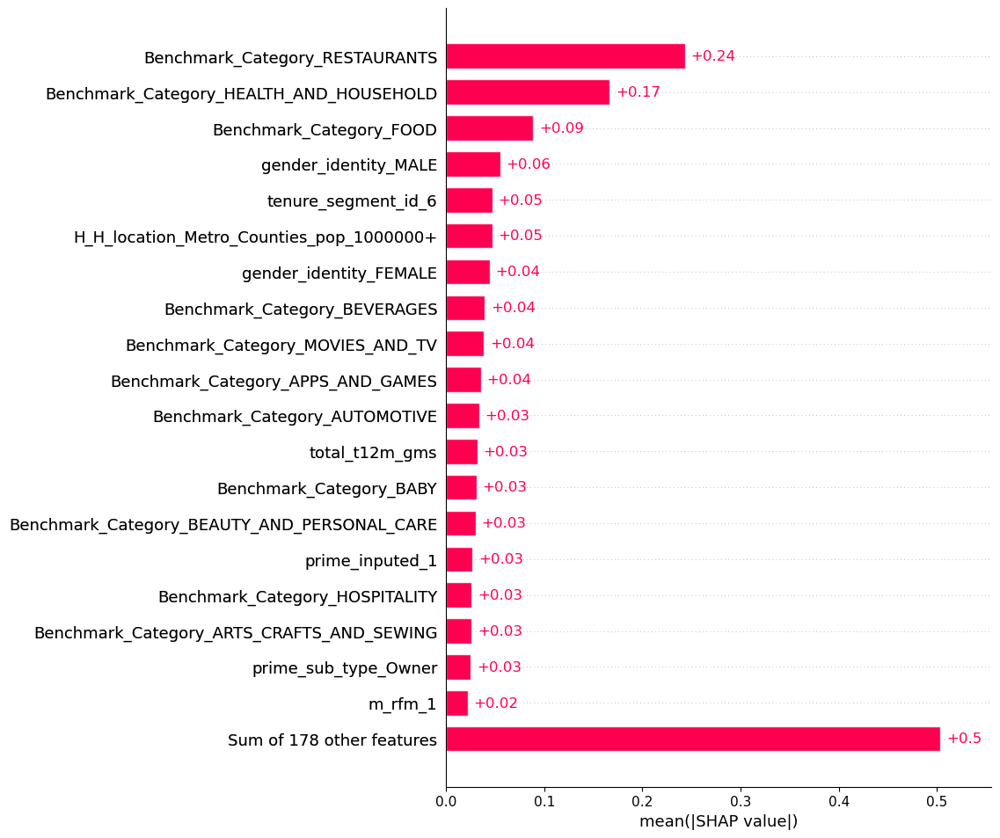

In [68]:
# SHAP plot
shap_explainer(X_train, xgmodel, "Tree", col_names, max_features = 20)

In [121]:
# Evaluation
eva_metrics = eva_model(d_test,y_test,xgmodel,"XGBoost",n_row = 0)
eva_metrics

[0.51205575 0.50910294 0.6770772  ... 0.4280145  0.6052053  0.5185767 ]
R2 Score of test set : -0.470247
Accuracy: 0.643429
Precision: 0.668384
Recall: 0.777995
F1 score: 0.719036


,model,R2,Accuracy,Precision,Recall,F1
0,XGBoost,-0.470247,0.643429,0.668384,0.777995,0.719036


In [102]:
slabel = "Demographic parity difference\nof SHAP values for women vs. men"
shap.group_difference_plot(shap_values, X_ccc['Type'], X_ccc, xmin=-1, xmax=1, xlabel=slabel)

TypeError: Could not convert TestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTestTest to numeric

In [100]:
drop_cols = ['label','customer_decoration_key','obfuscated_id','test_group_selected',\
                'rawPrediction','Survey','create_date_in_millis', 'last_updated_date_in_millis', 'region_id', 'spektr_date',\
                'Study_Status','Status','SurveyId','Reward_Amount','question_text','has_qualified_answer','Created_Date',\
                    'question_sequence_number']
X_ccc = df_test.drop(drop_cols,axis = 1)